In [1]:
from basiss.pile_of_code import *

### Fig. 1. Spatial Genomics generates maps of cancer clones (C,D)

<b>(C)</b> The barplot reveals the bulk genomic data (WGS plus targeted capture)
derived variant allele frequency (VAF) of selected branch mutations in genes denoted in
correspondingly coloured text (error bars report CIs = 5 - 95%).

<b>(D)</b> BaSISS mutation signal plots – each dot represents the location of a mutation specific barcode, relating to the mutations reported
in barplot (C)

In [2]:
with open('../pymc_model/data/newdata_saved.pkl', 'rb') as file:
    saved_lists = pkl.load(file)
mut_sample_list = saved_lists['mut_sample_list']
exp_sample_list = saved_lists['exp_sample_list']
imm_sample_list = saved_lists['imm_sample_list']
val_sample_list = saved_lists['val_sample_list']

In [3]:
wgs_data = pd.read_csv('../pymc_model/data/PD9694_genome_data_dec_2020.csv')


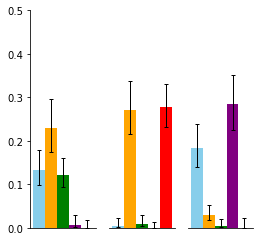

In [4]:
genes = ['CKAP5','DENND1A', 'KIAA0652', 'PTEN1', 'PTEN2']
wgs_data_sub = wgs_data[np.isin(wgs_data.ISS_id, genes)]
wgs_data_sub = wgs_data_sub.loc[[11,20,10,6,4],:]
plt.rcParams['figure.facecolor'] = 'w'
fig, axs  = plt.subplots(1,3, figsize=(4,4), sharex=True, gridspec_kw={'wspace':0.2})
for i, label in enumerate(['d', 'a','c']):
    a = np.array(wgs_data_sub[f'DIS_MtAll_PD9694{label}'] + wgs_data_sub[f'VAL_MtAll_PD9694{label}'])
    n = np.array(wgs_data_sub[f'DIS_sample_PD9694{label}_depth'] + wgs_data_sub[f'VAL_sample_PD9694{label}_depth'])
    b = n - a
    error = np.abs(np.array([st.beta(a[i]+1, b[i]+1).ppf([0.05,0.95]) for i in range(len(a))]) - (a/n)[:,None])
    axs[i].bar(np.arange(wgs_data_sub.shape[0]), (wgs_data_sub[f'DIS_MtAll_PD9694{label}'] + wgs_data_sub[f'VAL_MtAll_PD9694{label}']) /
            (wgs_data_sub[f'DIS_sample_PD9694{label}_depth'] + wgs_data_sub[f'VAL_sample_PD9694{label}_depth']),
            color=['skyblue', 'orange', 'green', 'purple', 'red'],width=1,yerr=error.T, error_kw={'capsize':2, 'elinewidth':1, 'capthick':1})
    
    axs[i].spines['right'].set_visible(False)
    #axs[i].set_xlabel(f'PD9694{label}')
    #axs[i].set_xticks(np.arange(len(genes)))
    #axs[i].set_xticklabels(genes, rotation=90)
    axs[i].axes.get_xaxis().set_visible(False)
    axs[i].spines['top'].set_visible(False)
    if i != 0:
        axs[i].axes.get_yaxis().set_visible(False)
        axs[i].spines['left'].set_visible(False)
    axs[i].set_ylim(0, 0.5)
#plt.savefig(f'./images/Fig1C_bottom.pdf'.format(i))



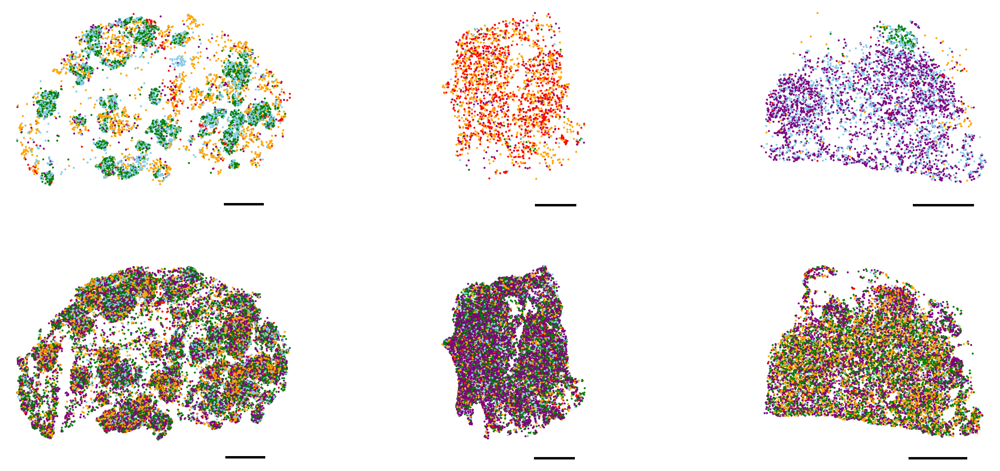

In [5]:
# Figure 2DE
plt.rcParams['figure.facecolor'] = 'w'


mut_alleles = ['CKAP5mut','DENND1Amut', 'KIAA0652mut', 'PTEN1mut', 'PTEN2mut']
wt_alleles = ['CKAP5wt', 'DENND1Awt', 'KIAA0652wt', 'PTEN1wt', 'PTEN2wt']

colors = ['skyblue', 'orange', 'green', 'purple', 'red']

fig, axs = plt.subplots(2,3,figsize=(mut_sample_list[0].spatial_dims[0]/4000*2.7,
                                mut_sample_list[0].spatial_dims[1]/4000*2))#,
                        #gridspec_kw={'width_ratios':[mut_sample_list[s].spatial_dims[0] for s in range(3)]})
for s in range(3):
    df_mut = pd.DataFrame(mut_sample_list[s].data)[mut_sample_list[s].iss_probability>0.6]
    
    # with random order 
    pos_x = []
    pos_y = []
    p_color = []
    for i, allele in enumerate(mut_alleles):
        pos_x.append(df_mut.PosX[df_mut.Gene == allele])
        pos_y.append(df_mut.PosY[df_mut.Gene == allele])
        p_color.append([colors[i]]*(df_mut.Gene == allele).sum())
    pos_x = np.concatenate(pos_x)
    pos_y = np.concatenate(pos_y)
    p_color = np.concatenate(p_color)
    p_order = np.random.permutation(p_color.shape[0])
    axs[0,s].scatter(pos_x[p_order], pos_y[p_order], color=p_color[p_order], s=10, rasterized=True)   
    
    # wihtout random order 
    #for i, allele in enumerate(mut_alleles):
    #    axs[0,s].scatter(df_mut.PosX[df_mut.Gene == allele], df_mut.PosY[df_mut.Gene == allele], color=colors[i], s=10)

    
    axs[0,s].plot([mut_sample_list[s].spatial_dims[0]*0.9,
              mut_sample_list[s].spatial_dims[0]*0.9 - 2.5e3 / 0.325 ],
             [mut_sample_list[s].spatial_dims[1]*(-0.1),
              mut_sample_list[s].spatial_dims[1]*(-0.1)], color='black', lw=5)
    
    axs[0,s].set_aspect('equal')
    axs[0,s].axis('off')
    axs[0,s].set_facecolor('black')
    
for s in range(3):
    df_mut = pd.DataFrame(mut_sample_list[s].data)[mut_sample_list[s].iss_probability>0.6]
    
    pos_x = []
    pos_y = []
    p_color = []
    for i, allele in enumerate(np.array(wt_alleles)[::-1]):
        pos_x.append(df_mut.PosX[df_mut.Gene == allele])
        pos_y.append(df_mut.PosY[df_mut.Gene == allele])
        p_color.append([np.array(colors)[::-1][i]]*(df_mut.Gene == allele).sum())
    pos_x = np.concatenate(pos_x)
    pos_y = np.concatenate(pos_y)
    p_color = np.concatenate(p_color)
    p_order = np.random.permutation(p_color.shape[0])
    axs[1,s].scatter(pos_x[p_order], pos_y[p_order], color=p_color[p_order], s=10,  rasterized=True)   
    
    #for i, allele in enumerate(np.array(wt_alleles)[::-1]):
        #axs[1,s].scatter(df_mut.PosX[df_mut.Gene == allele], df_mut.PosY[df_mut.Gene == allele], color=np.array(colors)[::-1][i], s=10)
                
    axs[1,s].plot([mut_sample_list[s].spatial_dims[0]*0.9,
              mut_sample_list[s].spatial_dims[0]*0.9 - 2.5e3 / 0.325 ],
             [mut_sample_list[s].spatial_dims[1]*(-0.1),
              mut_sample_list[s].spatial_dims[1]*(-0.1)], color='black', lw=5)
    
    axs[1,s].set_aspect('equal')
    axs[1,s].axis('off')
    axs[1,s].set_facecolor('black')
#plt.savefig(f'./images/Fig1D.pdf'.format(i))


## Fig. S2 Mapping cancer mutations in tissue context case PD9694 (E)

<b>(E)</b> Sample PD9694l, BaSISS mutation signal segregation patterns echo those seen in
PD9694d and support phylogenetic tree/genotype solution 1 (green and blue mutations co-localise:
green and yellow mutations segregate; lower FGFR1 expression in green mutation areas).

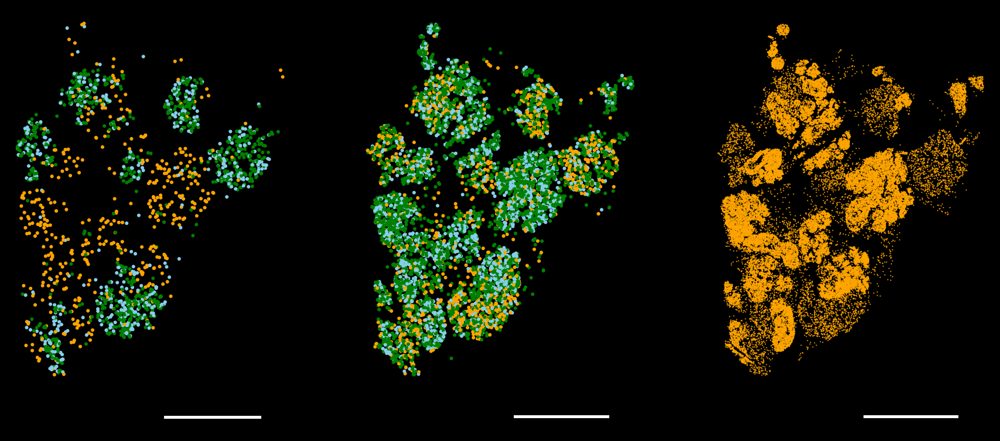

In [6]:
plt.rcParams['figure.facecolor'] = 'black'


mut_alleles = ['CKAP5mut','DENND1Amut', 'KIAA0652mut']
wt_alleles = ['CKAP5wt', 'DENND1Awt', 'KIAA0652wt']

colors = ['skyblue', 'orange', 'green']

s=3

fig, axs = plt.subplots(1,3,figsize=(mut_sample_list[s].spatial_dims[0]/1000*2.7/2,
                                mut_sample_list[s].spatial_dims[1]/1000*2/2))#,
                        #gridspec_kw={'width_ratios':[mut_sample_list[s].spatial_dims[0] for s in range(3)]})


df_mut = pd.DataFrame(mut_sample_list[s].data)[mut_sample_list[s].iss_probability>0.6]


pos_x = []
pos_y = []
p_color = []
for i, allele in enumerate(mut_alleles):
    pos_x.append(df_mut.PosX[df_mut.Gene == allele])
    pos_y.append(df_mut.PosY[df_mut.Gene == allele])
    p_color.append([colors[i]]*(df_mut.Gene == allele).sum())
pos_x = np.concatenate(pos_x)
pos_y = np.concatenate(pos_y)
p_color = np.concatenate(p_color)
p_order = np.random.permutation(p_color.shape[0])
axs[0].scatter(pos_x[p_order], pos_y[p_order], color=p_color[p_order], s=50/2)   

axs[0].plot([mut_sample_list[s].spatial_dims[0]*0.9,
          mut_sample_list[s].spatial_dims[0]*0.9 - 2.5e3 / 0.325 ],
         [mut_sample_list[s].spatial_dims[1]*(-0.1),
          mut_sample_list[s].spatial_dims[1]*(-0.1)], color='white', lw=10/2)

axs[0].set_aspect('equal')
axs[0].axis('off')
axs[0].set_facecolor('black')

pos_x = []
pos_y = []
p_color = []
for i, allele in enumerate(wt_alleles):
    pos_x.append(df_mut.PosX[df_mut.Gene == allele])
    pos_y.append(df_mut.PosY[df_mut.Gene == allele])
    p_color.append([colors[i]]*(df_mut.Gene == allele).sum())
pos_x = np.concatenate(pos_x)
pos_y = np.concatenate(pos_y)
p_color = np.concatenate(p_color)
p_order = np.random.permutation(p_color.shape[0])
axs[1].scatter(pos_x[p_order], pos_y[p_order], color=p_color[p_order], s=50/2)   

axs[1].plot([mut_sample_list[s].spatial_dims[0]*0.9,
          mut_sample_list[s].spatial_dims[0]*0.9 - 2.5e3 / 0.325 ],
         [mut_sample_list[s].spatial_dims[1]*(-0.1),
          mut_sample_list[s].spatial_dims[1]*(-0.1)], color='white', lw=10/2)

axs[1].set_aspect('equal')
axs[1].axis('off')
axs[1].set_facecolor('black')


axs[2].scatter(df_mut.PosX[df_mut.Gene == 'FGFR1exp'], df_mut.PosY[df_mut.Gene == 'FGFR1exp'], color='orange', s=1)
axs[2].plot([mut_sample_list[s].spatial_dims[0]*0.9,
          mut_sample_list[s].spatial_dims[0]*0.9 - 2.5e3 / 0.325 ],
         [mut_sample_list[s].spatial_dims[1]*(-0.1),
          mut_sample_list[s].spatial_dims[1]*(-0.1)], color='white', lw=10/2)
axs[2].set_aspect('equal')
axs[2].axis('off')
axs[2].set_facecolor('black')
#plt.savefig(f'./images/Fig2F.pdf'.format(i))
plt.show()

## Fig. 2. Histological, transcriptional and immunological differences between DCIS clones with different fates (D)

<b>(D)</b> Violin plots report nuclear morphological features of green (11,365 nuclei) and
orange (11,699 nuclei) regions (all differences significant, p < 0.0001, Mann-Whitney U).

In [7]:
from scipy.stats import mannwhitneyu

with open('../pymc_model/data/model_2805_final_21-01.pkl', 'rb') as file:
    samples_hierarchical_errosion = pkl.load(file)

In [8]:
condition_a_dcis_yellow = (np.isin(np.arange(len(np.array(mut_sample_list[1].ducts['linetype']))), [1,2,6]))
condition_a_dcis_red = (np.isin(np.arange(len(np.array(mut_sample_list[1].ducts['linetype']))), [5,3,4]))
condition_c_dcis_purple = (np.isin(np.arange(len(np.array(mut_sample_list[2].ducts['linetype']))), [4,5,6,7,8,9,10,11,12,13]))
condition_c_dcis_blue = (np.isin(np.arange(len(np.array(mut_sample_list[2].ducts['linetype']))), [0,23,24]))
condition_c_dcis_orange = (np.isin(np.arange(len(np.array(mut_sample_list[2].ducts['linetype']))), [1]))

In [9]:
d_dcis = mut_sample_list[0].filter_by_ducts()
a_red_dcis = mut_sample_list[1].filter_by_ducts(condition_a_dcis_red)
c_purple_dcis = mut_sample_list[2].filter_by_ducts(condition_c_dcis_purple)

In [10]:
a_yellow_dcis = mut_sample_list[1].filter_by_ducts(condition_a_dcis_yellow)
c_blue_dcis = mut_sample_list[2].filter_by_ducts(condition_c_dcis_blue)
c_orange_dcis = mut_sample_list[2].filter_by_ducts(condition_c_dcis_orange)

In [11]:
cell_properties = [pd.read_csv(mut_sample_list[0].cell_data),
                   pd.read_csv(mut_sample_list[1].cell_data),
                   pd.read_csv(mut_sample_list[2].cell_data)]


In [12]:
cell_properties_d = cell_properties[0][np.isin(cell_properties[0].x, d_dcis.cellpos[:,0]) &
                                              np.isin(cell_properties[0].y, d_dcis.cellpos[:,1])]

img_size = mut_sample_list[0].spatial_dims
samples_dims = np.array([112, 70])
scale = img_size / (np.array([112, 70])-1)
x_step = img_size[0] / (np.array([112, 70])[0]-1)
y_step = img_size[1] / (np.array([112, 70])[1]-1)
x_tile_coord = np.array(cell_properties_d.x//x_step).astype(int)
y_tile_coord = np.array(cell_properties_d.y//y_step).astype(int)

subclone_weights = samples_hierarchical_errosion['F_0'].mean(axis=0).reshape(*samples_dims,-1)
subclone_weights = subclone_weights[:,:,:6] / subclone_weights[:,:,:6,None].sum(axis=2)
th = 0.6

cell_properties_green = cell_properties_d[subclone_weights[x_tile_coord, y_tile_coord,1] > th]
cell_properties_blue = cell_properties_d[subclone_weights[x_tile_coord, y_tile_coord,3] > th]
cell_properties_orange = cell_properties_d[subclone_weights[x_tile_coord, y_tile_coord,5] > th]


cell_properties_red_dcis = cell_properties[1][np.isin(cell_properties[1].x, a_red_dcis.cellpos[:,0]) &
                                              np.isin(cell_properties[1].y, a_red_dcis.cellpos[:,1])]
cell_properties_purple_dcis = cell_properties[2][np.isin(cell_properties[2].x, c_purple_dcis.cellpos[:,0]) &
                                              np.isin(cell_properties[2].y, c_purple_dcis.cellpos[:,1])]

cell_properties_yellow_dcis = cell_properties[1][np.isin(cell_properties[1].x, a_yellow_dcis.cellpos[:,0]) &
                                              np.isin(cell_properties[1].y, a_yellow_dcis.cellpos[:,1])]
cell_properties_blue_dcis = cell_properties[2][np.isin(cell_properties[2].x, c_blue_dcis.cellpos[:,0]) &
                                              np.isin(cell_properties[2].y, c_blue_dcis.cellpos[:,1])]

cell_properties_orange_dcis = cell_properties[2][np.isin(cell_properties[2].x, c_orange_dcis.cellpos[:,0]) &
                                              np.isin(cell_properties[2].y, c_orange_dcis.cellpos[:,1])]

In [13]:
properties_by_subclone = [cell_properties_green,
                          cell_properties_orange]

#properties_by_subclone = [cell_properties_green,
#                          cell_properties_blue,
#                          cell_properties_orange,
#                          cell_properties_red_dcis,
#                          cell_properties_yellow_dcis,
#                          cell_properties_purple_dcis,
#                          cell_properties_blue_dcis]
#                          #cell_properties_orange_dcis]
#outliers = [x for x in data if x < lower or x > upper]

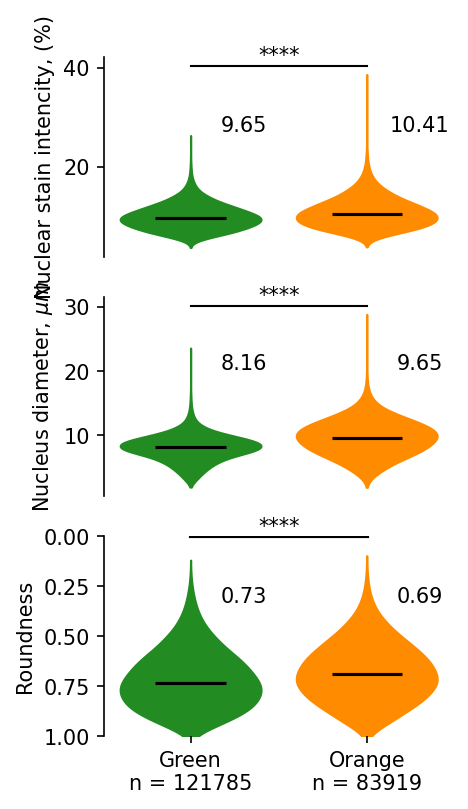

In [20]:
plt.rcParams['figure.facecolor'] = 'white'

pixel2um = 0.325

n_sbcl = len(properties_by_subclone)
#colors = ['forestgreen', 'dodgerblue', 'darkorange', 'tomato', 'darkorange', 'darkviolet', 'dodgerblue']
colors = ['forestgreen', 'darkorange']

fig, axs = plt.subplots(3,1, figsize=(1.5*n_sbcl, 6), sharex=True, dpi=150)

data4plots = [[#properties_by_subclone_filtered[sbcl]['size']*(pixel2um**2) for sbcl in range(n_sbcl)],
               properties_by_subclone[sbcl]['Blue_mean']/255*100 for sbcl in range(n_sbcl)],
              [properties_by_subclone[sbcl]['second_axis']*pixel2um for sbcl in range(n_sbcl)],
              [1/(properties_by_subclone[sbcl]['second_axis']/properties_by_subclone[sbcl]['first_axis']) for sbcl in range(n_sbcl)]]
titles = ['Nuclear stain intencity, (%)', 'Nucleus diameter, $\mu m$', 'Roundness']#['Area, $\mu^2$', 'Nucleus diameter, $\mu m$', 'Roundness']



for i in range(3):
    axs[i].set_ylabel(titles[i])
    parts = axs[i].violinplot(data4plots[i], np.arange(n_sbcl), showmedians=True, showextrema=False, widths=0.8, bw_method=0.25)
    for sbcl in range(n_sbcl):
        parts['bodies'][sbcl].set_color(colors[sbcl])
        parts['bodies'][sbcl].set_alpha(1)
    parts['cmedians'].set_color('black')
    axs[i].spines['right'].set_visible(False)
    axs[i].spines['top'].set_visible(False)
    axs[i].spines['bottom'].set_visible(False)
    axs[i].get_xaxis().set_visible(False)
axs[2].get_xaxis().set_visible(True)
axs[2].set_ylim(0,1)
axs[2].invert_yaxis()
axs[2].set_xticks(np.arange(n_sbcl))
axs[2].set_xticklabels([f'Green\nn = {properties_by_subclone[0].shape[0]}',
                        f'Orange\nn = {properties_by_subclone[1].shape[0]}'])
#axs[2].set_xticklabels([f'Green\nn = {properties_by_subclone_filtered[0].shape[0]}',
#                        f'Blue\nn = {properties_by_subclone_filtered[1].shape[0]}',
#                        f'Orange\nn = {properties_by_subclone_filtered[2].shape[0]}',
#                        f'Red DCIS\nn = {properties_by_subclone_filtered[3].shape[0]}',
#                        f'Orange DCIS\nn = {properties_by_subclone_filtered[4].shape[0]}',
#                        f'Purple DCIS\nn = {properties_by_subclone_filtered[4].shape[0]}',
#                        f'Blue DCIS\nn = {properties_by_subclone_filtered[6].shape[0]}'])
#                        #f'Orange DCIS\nn = {properties_by_subclone_filtered[7].shape[0]}

# add significance
for i in range(3):
    medians = [round(np.median(d),2) for d in data4plots[i]]
    if axs[i].get_ylim()[1] != 0:
        for sbcl in range(n_sbcl):
            axs[i].text(sbcl+0.3,axs[i].get_ylim()[1] * 0.7,medians[sbcl], ha='center', va='center')   
    else:
        for sbcl in range(n_sbcl):
            axs[i].text(sbcl+0.3,axs[i].get_ylim()[1] + 0.3,medians[sbcl], ha='center', va='center')
        
    stat, p_calc = mannwhitneyu(data4plots[i][0], data4plots[i][1])
    text = ''
    p = 0.05
    maxasterix = 4
    while p_calc < p:
        text += '*'
        p /= 10.
        if len(text) == maxasterix:
            break

    if len(text) == 0:
        text = 'n. s.'
    
    if axs[i].get_ylim()[1] != 0:
        axs[i].text(0.5,axs[i].get_ylim()[1] * 1.05,text, ha='center', va='center')
        axs[i].plot([0,1], [axs[i].get_ylim()[1]]*2, color='black', lw=1)
    else:
        axs[i].text(0.5,axs[i].get_ylim()[1] - 0.05,text, ha='center', va='center')
        axs[i].plot([0,1], [axs[i].get_ylim()[1]]*2, color='black', lw=2)
        
#plt.savefig(f'./images/Fig3F.pdf'.format(i), dpi=300)
plt.show()


## Fig. 2. Histological, transcriptional and immunological differences between DCIS clones with different fates (E)

<b>(E)</b> BaSISS and ISS data projected on the DAPI image reveal orange clone specific characteristics in
a selected area of PD9694l

In [21]:
img_dapi_mut_raw = tifffile.imread('../Globus/DAPI_2805/Mutation/2805_6.1/2805_6_left_mutation_MIP_base1_c1_ORG.tif')
img_dapi_exp_raw = tifffile.imread('../Globus/DAPI_2805/Expression/2805_6.1/Exp2805_6_part1_base1_c1_ORG.tif')
img_dapi_imm_raw = tifffile.imread('../Globus/DAPI_2805/Immuno/2805_6.1/Imm2805_6_left_immuno_MIP_base1_c1_ORG.tif')

In [22]:
df_imm = pd.read_csv('../GMM_decoding/remapped/Imm_PD9694l2_GMMdecoding_remapped.csv')
df_exp = pd.read_csv('../GMM_decoding/remapped/Exp_PD9694l2_GMMdecoding_remapped.csv')
df_mut = pd.read_csv('../GMM_decoding/remapped/Mut_PD9694l2_GMMdecoding_remapped.csv')

In [23]:
def cut_df(df, xborders, yborders, gap=10, rescale=True):
    df_cut = df[(df.X > xborders[0]+gap) &
                (df.X < xborders[1]-gap) &
                (df.Y > yborders[0]+gap) &
                (df.Y < yborders[1]-gap)]

    if rescale:
        df_cut.X -= xborders[0]
        df_cut.Y -= yborders[0]
    return df_cut

mut_xborders = np.array([6800, 13000])
mut_yborders = np.array([3600, 11500])
exp_xborders = mut_xborders+200
exp_yborders = mut_yborders+1000
imm_xborders = mut_xborders+1300
imm_yborders = mut_yborders+200

s = 3
df_mut = df_mut[df_mut.Probability > 0.6]#pd.DataFrame(mut_sample_list[s].data)[mut_sample_list[s].iss_probability>0.6]
df_exp = df_exp[df_exp.Probability > 0.6]#pd.DataFrame(exp_sample_list[s].data)[exp_sample_list[s].iss_probability>0.6]
df_imm = df_imm[df_imm.Probability > 0.6]#pd.DataFrame(imm_sample_list[s].data)[imm_sample_list[s].iss_probability>0.6]

df_mut_cut = cut_df(df_mut, mut_xborders, mut_yborders)
df_exp_cut = cut_df(df_exp, exp_xborders, exp_yborders)
df_imm_cut = cut_df(df_imm, imm_xborders, imm_yborders)

img_dapi_mut_cut = img_dapi_mut_raw[slice(*mut_yborders),
                                    slice(*mut_xborders)]
img_dapi_exp_cut = img_dapi_exp_raw[slice(*exp_yborders),
                                    slice(*exp_xborders)]
img_dapi_imm_cut = img_dapi_imm_raw[slice(*imm_yborders),
                                    slice(*imm_xborders)]


p_l, p_h = np.percentile(img_dapi_mut_cut, (0.1, 99.9))
img_dapi_mut_cut = exposure.rescale_intensity(img_dapi_mut_cut, in_range=(p_l, p_h)) 
img_dapi_mut_cut = img_dapi_mut_cut/img_dapi_mut_cut.max()
p_l, p_h = np.percentile(img_dapi_exp_cut, (0.1, 99.9))
img_dapi_exp_cut = exposure.rescale_intensity(img_dapi_exp_cut, in_range=(p_l, p_h)) 
img_dapi_exp_cut = img_dapi_exp_cut/img_dapi_exp_cut.max()
p_l, p_h = np.percentile(img_dapi_imm_cut, (0.1, 99.9))
img_dapi_imm_cut = exposure.rescale_intensity(img_dapi_imm_cut, in_range=(p_l, p_h)) 
img_dapi_imm_cut = img_dapi_imm_cut/img_dapi_imm_cut.max()

/nfs/research1/gerstung/artem/miniconda/envs/PyMC-env/lib/python3.7/site-packages/pandas/core/generic.py:5168: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/nfs/research1/gerstung/artem/miniconda/envs/PyMC-env/lib/python3.7/site-packages/pandas/core/generic.py:5168: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/nfs/research1/gerstung/artem/miniconda/envs/PyMC-env/lib/python3.7/site-packages/pandas/core/generic.py:5168: SettingWithCopyWarning: 
A value is trying to be 

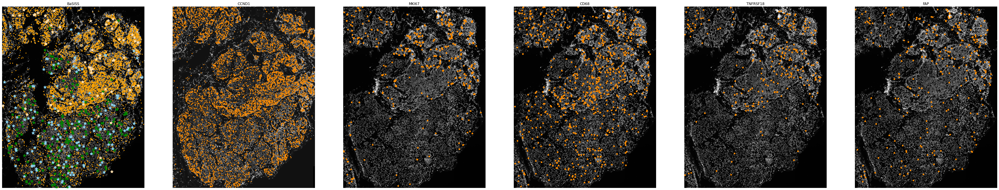

In [24]:
plt.rcParams['figure.facecolor'] = 'w'


fig, axs = plt.subplots(1,6,figsize=(10*6,12),sharey=True)

axs[0].imshow(img_dapi_mut_cut, cmap='Greys_r', vmin=0, vmax=1)
axs[0].scatter(df_mut_cut[df_mut_cut.Name=='FGFR1exp'].X, df_mut_cut[df_mut_cut.Name=='FGFR1exp'].Y, color='orange',s=5,  rasterized=True)   
axs[0].scatter(df_mut_cut[df_mut_cut.Name=='KIAA0652mut'].X, df_mut_cut[df_mut_cut.Name=='KIAA0652mut'].Y, color='green',s=100,marker=(5, 1),  rasterized=True)   
axs[0].scatter(df_mut_cut[df_mut_cut.Name=='DENND1Amut'].X, df_mut_cut[df_mut_cut.Name=='DENND1Amut'].Y, color='navajowhite',s=100,marker=(5, 1),  rasterized=True)   
axs[0].scatter(df_mut_cut[df_mut_cut.Name=='CKAP5mut'].X, df_mut_cut[df_mut_cut.Name=='CKAP5mut'].Y, color='skyblue',s=100,marker=(5, 1),  rasterized=True)   
axs[0].set_aspect('equal')
axs[0].invert_yaxis()
axs[0].axis('off')
axs[0].set_title('BaSISS')

axs[1].imshow(img_dapi_exp_cut, cmap='Greys_r', vmin=0, vmax=1)
colors = ['darkorange']
genes = ['CCND1']
pos_x = []
pos_y = []
p_color = []
for i, allele in enumerate(genes):
    pos_x.append(df_exp_cut.X[df_exp_cut.Name == allele])
    pos_y.append(df_exp_cut.Y[df_exp_cut.Name == allele])
    p_color.append([colors[i]]*(df_exp_cut.Name == allele).sum())
pos_x = np.concatenate(pos_x)
pos_y = np.concatenate(pos_y)
p_color = np.concatenate(p_color)
p_order = np.random.permutation(p_color.shape[0])
axs[1].scatter(pos_x[p_order], pos_y[p_order], color=p_color[p_order], s=5,  rasterized=True)   
axs[1].set_aspect('equal')
axs[1].invert_yaxis()
axs[1].axis('off')
axs[1].set_title('CCND1')

axs[2].imshow(img_dapi_imm_cut, cmap='Greys_r', vmin=0, vmax=1)
# with random order 
colors = np.array(['darkorange'])[::-1]
genes = np.array(['MKI67'])[::-1]
pos_x = []
pos_y = []
p_color = []
for i, allele in enumerate(genes):
    pos_x.append(df_imm_cut.X[df_imm_cut.Name == allele])
    pos_y.append(df_imm_cut.Y[df_imm_cut.Name == allele])
    p_color.append([colors[i]]*(df_imm_cut.Name == allele).sum())
pos_x = np.concatenate(pos_x)
pos_y = np.concatenate(pos_y)
p_color = np.concatenate(p_color)
p_order = np.random.permutation(p_color.shape[0])
axs[2].scatter(pos_x[p_order], pos_y[p_order], color=p_color[p_order], s=20,  rasterized=True)   
axs[2].set_aspect('equal')
axs[2].invert_yaxis()
axs[2].axis('off')
axs[2].set_title('MKI67')


axs[3].imshow(img_dapi_imm_cut, cmap='Greys_r', vmin=0, vmax=1)
# with random order 
colors = ['darkorange']
genes = ['CD68']
pos_x = []
pos_y = []
p_color = []
for i, allele in enumerate(genes):
    pos_x.append(df_imm_cut.X[df_imm_cut.Name == allele])
    pos_y.append(df_imm_cut.Y[df_imm_cut.Name == allele])
    p_color.append([colors[i]]*(df_imm_cut.Name == allele).sum())
pos_x = np.concatenate(pos_x)
pos_y = np.concatenate(pos_y)
p_color = np.concatenate(p_color)
p_order = np.random.permutation(p_color.shape[0])
axs[3].scatter(pos_x[p_order], pos_y[p_order], color=p_color[p_order], s=20,  rasterized=True)   
axs[3].set_aspect('equal')
axs[3].invert_yaxis()
axs[3].axis('off')
axs[3].set_title('CD68')


axs[4].imshow(img_dapi_imm_cut, cmap='Greys_r', vmin=0, vmax=1)
# with random order 
colors = ['darkorange']
genes = ['TNFRSF18']
pos_x = []
pos_y = []
p_color = []
for i, allele in enumerate(genes):
    pos_x.append(df_imm_cut.X[df_imm_cut.Name == allele])
    pos_y.append(df_imm_cut.Y[df_imm_cut.Name == allele])
    p_color.append([colors[i]]*(df_imm_cut.Name == allele).sum())
pos_x = np.concatenate(pos_x)
pos_y = np.concatenate(pos_y)
p_color = np.concatenate(p_color)
p_order = np.random.permutation(p_color.shape[0])
axs[4].scatter(pos_x[p_order], pos_y[p_order], color=p_color[p_order], s=20,  rasterized=True)   
axs[4].set_aspect('equal')
axs[4].invert_yaxis()
axs[4].axis('off')
axs[4].set_title('TNFRSF18')


axs[5].imshow(img_dapi_imm_cut, cmap='Greys_r', vmin=0, vmax=1)
# with random order 
colors = ['darkorange']
genes = ['FAP']
pos_x = []
pos_y = []
p_color = []
for i, allele in enumerate(genes):
    pos_x.append(df_imm_cut.X[df_imm_cut.Name == allele])
    pos_y.append(df_imm_cut.Y[df_imm_cut.Name == allele])
    p_color.append([colors[i]]*(df_imm_cut.Name == allele).sum())
pos_x = np.concatenate(pos_x)
pos_y = np.concatenate(pos_y)
p_color = np.concatenate(p_color)
p_order = np.random.permutation(p_color.shape[0])
axs[5].scatter(pos_x[p_order], pos_y[p_order], color=p_color[p_order], s=20,  rasterized=True)   
axs[5].set_aspect('equal')
axs[5].invert_yaxis()
axs[5].axis('off')
axs[5].set_title('FAP')


#plt.savefig(f'./images/Fig2H.pdf'.format(i))
plt.show()

## Fig. 3. Temporal ordering of genetic, transcriptional and immunological changes during the development of invasive cancer. 

<b>(A)</b> Potential driver mutations annotate relevant branches of the phylogenetic
tree. DCIS onset changes (left box) include PTEN driver mutations and expression of genes
typically associated with epithelial/cancer origin. Invasive onset changes (right box) include
expression of genes associated with the tumour microenvironment (TME).

In [25]:
img_dapi_mut_raw = tifffile.imread('../GMM_restored_DAPI/Mut_PD9694c3.tif')
img_dapi_imm_raw = tifffile.imread('../GMM_restored_DAPI/Imm_PD9694c2.tif')
img_dapi_exp_raw = tifffile.imread('../GMM_restored_DAPI/Exp_PD9694c2.tif')

In [26]:
df_imm = pd.read_csv('../GMM_decoding/remapped/Imm_PD9694c2_GMMdecoding_remapped.csv')
df_mut = pd.read_csv('../GMM_decoding/remapped/Mut_PD9694c3_GMMdecoding_remapped.csv')
df_exp = pd.read_csv('../GMM_decoding/remapped/Exp_PD9694c2_GMMdecoding_remapped.csv')

In [27]:
def cut_df(df, xborders, yborders, gap=10, rescale=True):
    df_cut = copy.copy(df[(df.X > xborders[0]+gap) &
                (df.X < xborders[1]-gap) &
                (df.Y > yborders[0]+gap) &
                (df.Y < yborders[1]-gap)])

    if rescale:
        df_cut.loc[:,'X'] = list(df_cut.loc[:,'X'] - xborders[0])
        df_cut.loc[:,'Y'] = list(df_cut.loc[:,'Y'] - yborders[0])
    return df_cut

mut_xborders = [np.array([22500, 29000]), np.array([14500, 21000])]
mut_yborders = [np.array([6500, 11500]), np.array([1800, 6800])]
imm_xborders = [mut_xborders[0]+500, mut_xborders[1]]
imm_yborders = [mut_yborders[0]+1000, mut_yborders[1]]
exp_xborders = [mut_xborders[0], mut_xborders[1]-200]
exp_yborders = [mut_yborders[0], mut_yborders[1]-800]


s=2

df_mut = df_mut[df_mut.Probability > 0.6]
df_imm = df_imm[df_imm.Probability > 0.6]
df_exp = df_exp[df_exp.Probability > 0.6]

df_mut_cut = [cut_df(df_mut, mut_xborders[0], mut_yborders[0]), cut_df(df_mut, mut_xborders[1], mut_yborders[1])]
df_imm_cut = [cut_df(df_imm, imm_xborders[0], imm_yborders[0]), cut_df(df_imm, imm_xborders[1], imm_yborders[1])]
df_exp_cut = [cut_df(df_exp, exp_xborders[0], exp_yborders[0]), cut_df(df_exp, exp_xborders[1], exp_yborders[1])]



img_dapi_mut_cut = [img_dapi_mut_raw[slice(*mut_yborders[0]),
                                    slice(*mut_xborders[0])],
                    img_dapi_mut_raw[slice(*mut_yborders[1]),
                                    slice(*mut_xborders[1])]]

img_dapi_imm_cut = [img_dapi_imm_raw[slice(*imm_yborders[0]),
                                    slice(*imm_xborders[0])], 
                    img_dapi_imm_raw[slice(*imm_yborders[1]),
                                    slice(*imm_xborders[1])]]

img_dapi_exp_cut = [img_dapi_exp_raw[slice(*exp_yborders[0]),
                                    slice(*exp_xborders[0])], 
                    img_dapi_exp_raw[slice(*exp_yborders[1]),
                                    slice(*exp_xborders[1])]]

img_dapi_mut_cut = [img_dapi_mut_cut[i]/img_dapi_mut_cut[i].max() for i in range(len(img_dapi_mut_cut))]
img_dapi_imm_cut = [img_dapi_imm_cut[i]/img_dapi_imm_cut[i].max() for i in range(len(img_dapi_mut_cut))]
img_dapi_exp_cut = [img_dapi_exp_cut[i]/img_dapi_exp_cut[i].max() for i in range(len(img_dapi_mut_cut))]


for i in range(len(img_dapi_mut_cut)):
    p_l, p_h = np.percentile(img_dapi_mut_cut[i], (1, 99))
    img_dapi_mut_cut[i] = exposure.rescale_intensity(img_dapi_mut_cut[i], in_range=(p_l, p_h))
    img_dapi_mut_cut[i] = np.maximum(0, img_dapi_mut_cut[i]-0.15)
    
    p_l, p_h = np.percentile(img_dapi_imm_cut[i], (1, 99))
    img_dapi_imm_cut[i] = exposure.rescale_intensity(img_dapi_imm_cut[i], in_range=(p_l, p_h)) 
    img_dapi_imm_cut[i] = np.maximum(0, img_dapi_imm_cut[i]-0.25)
    
    p_l, p_h = np.percentile(img_dapi_exp_cut[i], (1, 99))
    img_dapi_exp_cut[i] = exposure.rescale_intensity(img_dapi_exp_cut[i], in_range=(p_l, p_h)) 
    img_dapi_exp_cut[i] = np.maximum(0, img_dapi_exp_cut[i]-0.25)

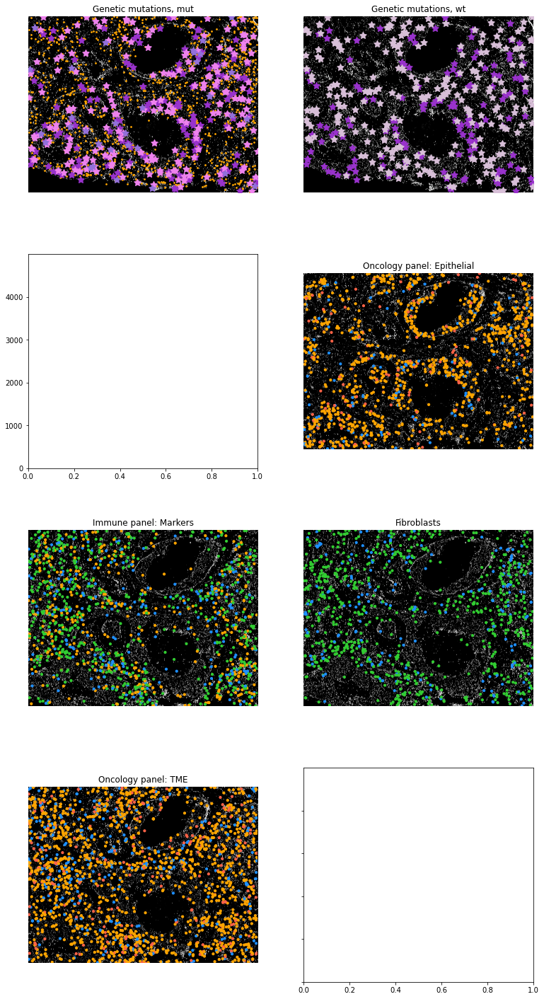

In [28]:
plt.rcParams['figure.facecolor'] = 'w'

fig, axs = plt.subplots(4,2,figsize=(8*2*0.8,8*4*0.8), sharey=True)


axs[0,0].imshow(img_dapi_mut_cut[1], cmap='Greys_r', vmin=0, vmax=1)

fgfr_selected = True#(np.random.randint(0,size=df_mut_cut.shape[0]) == 0)

axs[0,0].scatter(df_mut_cut[1][(df_mut_cut[1].Name=='FGFR1exp') & fgfr_selected].X, df_mut_cut[1][(df_mut_cut[1].Name=='FGFR1exp') & fgfr_selected].Y, color='orange',s=3,  rasterized=True)   
axs[0,0].scatter(df_mut_cut[1][df_mut_cut[1].Name=='PTEN1mut'].X, df_mut_cut[1][df_mut_cut[1].Name=='PTEN1mut'].Y, color='darkorchid',s=100,marker=(5, 1),  rasterized=True)   
axs[0,0].scatter(df_mut_cut[1][df_mut_cut[1].Name=='TMEM8Amut'].X, df_mut_cut[1][df_mut_cut[1].Name=='TMEM8Amut'].Y, color='violet',s=100,marker=(5, 1),  rasterized=True)   
axs[0,0].scatter(df_mut_cut[1][df_mut_cut[1].Name=='DSELmut'].X, df_mut_cut[1][df_mut_cut[1].Name=='DSELmut'].Y, color='mediumpurple',s=100,marker=(5, 1),  rasterized=True)   
axs[0,0].scatter(df_mut_cut[1][df_mut_cut[1].Name=='DENND1Amut'].X, df_mut_cut[1][df_mut_cut[1].Name=='DENND1Amut'].Y, color='navajowhite',s=100,marker=(5, 1),  rasterized=True)   
axs[0,0].set_aspect('equal')
axs[0,0].invert_yaxis()
axs[0,0].axis('off')
axs[0,0].set_title('Genetic mutations, mut')
axs[0,1].imshow(img_dapi_mut_cut[1], cmap='Greys_r', vmin=0, vmax=1)

fgfr_selected = True#(np.random.randint(0,size=df_mut_cut.shape[0]) == 0)

axs[0,1].scatter(df_mut_cut[1][df_mut_cut[1].Name=='PTEN1mut'].X, df_mut_cut[1][df_mut_cut[1].Name=='PTEN1mut'].Y, color='darkorchid',s=100,marker=(5, 1),  rasterized=True)   
axs[0,1].scatter(df_mut_cut[1][df_mut_cut[1].Name=='PTEN1wt'].X, df_mut_cut[1][df_mut_cut[1].Name=='PTEN1wt'].Y, color='thistle',s=100,marker=(5, 1),  rasterized=True)   
axs[0,1].set_aspect('equal')
axs[0,1].invert_yaxis()
axs[0,1].axis('off')
axs[0,1].set_title('Genetic mutations, wt')


axs[1,1].imshow(img_dapi_exp_cut[1], cmap='Greys_r', vmin=0, vmax=1)
colors = ['orange', 'dodgerblue', 'tomato']
genes = ['KRT8', 'CDH1', 'EpCAM']
pos_x = []
pos_y = []
p_color = []
for i, allele in enumerate(genes):
    pos_x.append(df_exp_cut[1].X[df_exp_cut[1].Name == allele])
    pos_y.append(df_exp_cut[1].Y[df_exp_cut[1].Name == allele])
    p_color.append([colors[i]]*(df_exp_cut[1].Name == allele).sum())
pos_x = np.concatenate(pos_x)
pos_y = np.concatenate(pos_y)
p_color = np.concatenate(p_color)
p_order = np.random.permutation(p_color.shape[0])
axs[1,1].scatter(pos_x[p_order], pos_y[p_order], color=p_color[p_order], s=10,  rasterized=True)   
axs[1,1].set_aspect('equal')
axs[1,1].invert_yaxis()
axs[1,1].axis('off')
axs[1,1].set_title('Oncology panel: Epithelial')


axs[2,0].imshow(img_dapi_imm_cut[1], cmap='Greys_r', vmin=0, vmax=1)
colors = ['orange', 'limegreen', 'dodgerblue']
genes = ['PTPRC','FCGR3A', 'CSF1R']
pos_x = []
pos_y = []
p_color = []
for i, allele in enumerate(genes):
    pos_x.append(df_imm_cut[1].X[df_imm_cut[1].Name == allele])
    pos_y.append(df_imm_cut[1].Y[df_imm_cut[1].Name == allele])
    p_color.append([colors[i]]*(df_imm_cut[1].Name == allele).sum())
pos_x = np.concatenate(pos_x)
pos_y = np.concatenate(pos_y)
p_color = np.concatenate(p_color)
p_order = np.random.permutation(p_color.shape[0])
axs[2,0].scatter(pos_x[p_order], pos_y[p_order], color=p_color[p_order], s=10,  rasterized=True)   
axs[2,0].set_aspect('equal')
axs[2,0].invert_yaxis()
axs[2,0].axis('off')
axs[2,0].set_title('Immune panel: Markers')


axs[3,0].imshow(img_dapi_exp_cut[1], cmap='Greys_r', vmin=0, vmax=1)
colors = ['orange', 'dodgerblue', 'tomato']
genes = ['COL3A1','MMP11', 'KLF2']
pos_x = []
pos_y = []
p_color = []
for i, allele in enumerate(genes):
    pos_x.append(df_exp_cut[1].X[df_exp_cut[1].Name == allele])
    pos_y.append(df_exp_cut[1].Y[df_exp_cut[1].Name == allele])
    p_color.append([colors[i]]*(df_exp_cut[1].Name == allele).sum())
pos_x = np.concatenate(pos_x)
pos_y = np.concatenate(pos_y)
p_color = np.concatenate(p_color)
p_order = np.random.permutation(p_color.shape[0])
axs[3,0].scatter(pos_x[p_order], pos_y[p_order], color=p_color[p_order], s=10,  rasterized=True)   
axs[3,0].set_aspect('equal')
axs[3,0].invert_yaxis()
axs[3,0].axis('off')
axs[3,0].set_title('Oncology panel: TME')


axs[2,1].imshow(img_dapi_imm_cut[1], cmap='Greys_r', vmin=0, vmax=1)
colors = ['limegreen', 'dodgerblue']
genes = ['FAP','CD34']
pos_x = []
pos_y = []
p_color = []
for i, allele in enumerate(genes):
    pos_x.append(df_imm_cut[1].X[df_imm_cut[1].Name == allele])
    pos_y.append(df_imm_cut[1].Y[df_imm_cut[1].Name == allele])
    p_color.append([colors[i]]*(df_imm_cut[1].Name == allele).sum())
pos_x = np.concatenate(pos_x)
pos_y = np.concatenate(pos_y)
p_color = np.concatenate(p_color)
p_order = np.random.permutation(p_color.shape[0])
axs[2,1].scatter(pos_x[p_order], pos_y[p_order], color=p_color[p_order], s=10,  rasterized=True)   
axs[2,1].set_aspect('equal')
axs[2,1].invert_yaxis()
axs[2,1].axis('off')
axs[2,1].set_title('Fibroblasts')


#plt.savefig(f'./images/Fig3C.pdf'.format(i))
plt.show()

## Fig. S4. Temporal ordering during progression to invasion
<b>(D)</b> Focus area of PD9694c (corresponds to S4C box d) region. This duct is predominantly occupied by the orange DCIS clone
(Fig 3B-C) but a purple clone region is also present: left, middle and lower box reveal select purple
subclone mutations (blue mutations are also present but not shown). Given the evolutionary
distance between these clones (decades) this is surprising. The presence of clustering immune/
fibroblast signals (top right box) that colocalise specifically to the purple clone, this could be
reinvasion of the duct by established invasive disease.

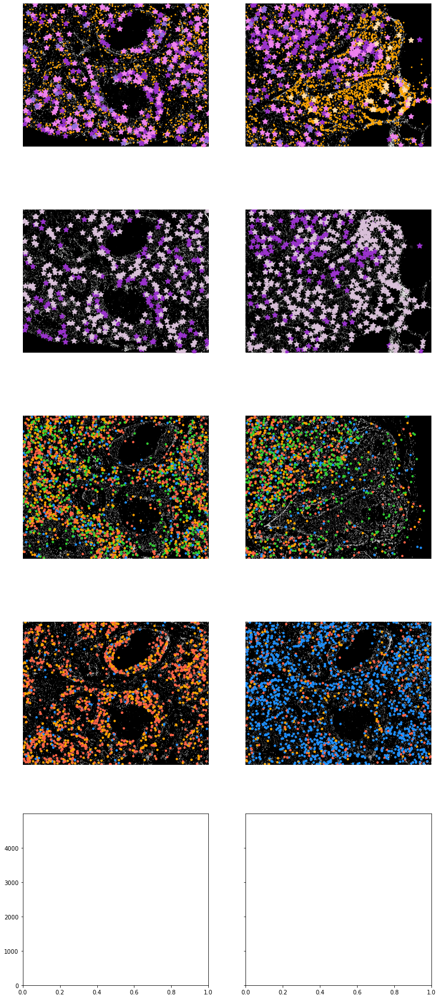

In [30]:
plt.rcParams['figure.facecolor'] = 'w'

fig, axs = plt.subplots(5,2,figsize=(8*2*0.8,8*5*0.8), sharey=True)

axs[0,1].imshow(img_dapi_mut_cut[0], cmap='Greys_r', vmin=0, vmax=1)

fgfr_selected = True#(np.random.randint(0,size=df_mut_cut.shape[0]) == 0)

axs[0,1].scatter(df_mut_cut[0][(df_mut_cut[0].Name=='FGFR1exp') & fgfr_selected].X, df_mut_cut[0][(df_mut_cut[0].Name=='FGFR1exp') & fgfr_selected].Y, color='orange',s=3)
axs[0,1].scatter(df_mut_cut[0][df_mut_cut[0].Name=='PTEN1mut'].X, df_mut_cut[0][df_mut_cut[0].Name=='PTEN1mut'].Y, color='darkorchid',s=100,marker=(5, 1))
axs[0,1].scatter(df_mut_cut[0][df_mut_cut[0].Name=='TMEM8Amut'].X, df_mut_cut[0][df_mut_cut[0].Name=='TMEM8Amut'].Y, color='violet',s=100,marker=(5, 1))
axs[0,1].scatter(df_mut_cut[0][df_mut_cut[0].Name=='DSELmut'].X, df_mut_cut[0][df_mut_cut[0].Name=='DSELmut'].Y, color='mediumpurple',s=100,marker=(5, 1))
axs[0,1].scatter(df_mut_cut[0][df_mut_cut[0].Name=='DENND1Amut'].X, df_mut_cut[0][df_mut_cut[0].Name=='DENND1Amut'].Y, color='navajowhite',s=100,marker=(5, 1))
axs[0,1].set_aspect('equal')
axs[0,1].invert_yaxis()
axs[0,1].axis('off')

axs[0,0].imshow(img_dapi_mut_cut[1], cmap='Greys_r', vmin=0, vmax=1)

fgfr_selected = True#(np.random.randint(0,size=df_mut_cut.shape[0]) == 0)

axs[0,0].scatter(df_mut_cut[1][(df_mut_cut[1].Name=='FGFR1exp') & fgfr_selected].X, df_mut_cut[1][(df_mut_cut[1].Name=='FGFR1exp') & fgfr_selected].Y, color='orange',s=3)
axs[0,0].scatter(df_mut_cut[1][df_mut_cut[1].Name=='PTEN1mut'].X, df_mut_cut[1][df_mut_cut[1].Name=='PTEN1mut'].Y, color='darkorchid',s=100,marker=(5, 1))
axs[0,0].scatter(df_mut_cut[1][df_mut_cut[1].Name=='TMEM8Amut'].X, df_mut_cut[1][df_mut_cut[1].Name=='TMEM8Amut'].Y, color='violet',s=100,marker=(5, 1))
axs[0,0].scatter(df_mut_cut[1][df_mut_cut[1].Name=='DSELmut'].X, df_mut_cut[1][df_mut_cut[1].Name=='DSELmut'].Y, color='mediumpurple',s=100,marker=(5, 1))
axs[0,0].scatter(df_mut_cut[1][df_mut_cut[1].Name=='DENND1Amut'].X, df_mut_cut[1][df_mut_cut[1].Name=='DENND1Amut'].Y, color='navajowhite',s=100,marker=(5, 1))
axs[0,0].set_aspect('equal')
axs[0,0].invert_yaxis()
axs[0,0].axis('off')

axs[1,1].imshow(img_dapi_mut_cut[0], cmap='Greys_r', vmin=0, vmax=1)

fgfr_selected = True#(np.random.randint(0,size=df_mut_cut.shape[0]) == 0)

axs[1,1].scatter(df_mut_cut[0][df_mut_cut[0].Name=='PTEN1mut'].X, df_mut_cut[0][df_mut_cut[0].Name=='PTEN1mut'].Y, color='darkorchid',s=100,marker=(5, 1))
axs[1,1].scatter(df_mut_cut[0][df_mut_cut[0].Name=='PTEN1wt'].X, df_mut_cut[0][df_mut_cut[0].Name=='PTEN1wt'].Y, color='thistle',s=100,marker=(5, 1))
axs[1,1].set_aspect('equal')
axs[1,1].invert_yaxis()
axs[1,1].axis('off')

axs[1,0].imshow(img_dapi_mut_cut[1], cmap='Greys_r', vmin=0, vmax=1)

fgfr_selected = True#(np.random.randint(0,size=df_mut_cut.shape[0]) == 0)

axs[1,0].scatter(df_mut_cut[1][df_mut_cut[1].Name=='PTEN1mut'].X, df_mut_cut[1][df_mut_cut[1].Name=='PTEN1mut'].Y, color='darkorchid',s=100,marker=(5, 1))
axs[1,0].scatter(df_mut_cut[1][df_mut_cut[1].Name=='PTEN1wt'].X, df_mut_cut[1][df_mut_cut[1].Name=='PTEN1wt'].Y, color='thistle',s=100,marker=(5, 1))
axs[1,0].set_aspect('equal')
axs[1,0].invert_yaxis()
axs[1,0].axis('off')

axs[2,1].imshow(img_dapi_imm_cut[0], cmap='Greys_r', vmin=0, vmax=1)
colors = ['orange', 'limegreen', 'tomato', 'dodgerblue']
genes = ['FCGR3A','CD4', 'FAP', 'CSF1R']
pos_x = []
pos_y = []
p_color = []
for i, allele in enumerate(genes):
    pos_x.append(df_imm_cut[0].X[df_imm_cut[0].Name == allele])
    pos_y.append(df_imm_cut[0].Y[df_imm_cut[0].Name == allele])
    p_color.append([colors[i]]*(df_imm_cut[0].Name == allele).sum())
pos_x = np.concatenate(pos_x)
pos_y = np.concatenate(pos_y)
p_color = np.concatenate(p_color)
p_order = np.random.permutation(p_color.shape[0])
axs[2,1].scatter(pos_x[p_order], pos_y[p_order], color=p_color[p_order], s=10) 
axs[2,1].set_aspect('equal')
axs[2,1].invert_yaxis()
axs[2,1].axis('off')

axs[2,0].imshow(img_dapi_imm_cut[1], cmap='Greys_r', vmin=0, vmax=1)
colors = ['orange', 'limegreen', 'tomato', 'dodgerblue']
genes = ['FCGR3A','CD4', 'FAP', 'CSF1R']
pos_x = []
pos_y = []
p_color = []
for i, allele in enumerate(genes):
    pos_x.append(df_imm_cut[1].X[df_imm_cut[1].Name == allele])
    pos_y.append(df_imm_cut[1].Y[df_imm_cut[1].Name == allele])
    p_color.append([colors[i]]*(df_imm_cut[1].Name == allele).sum())
pos_x = np.concatenate(pos_x)
pos_y = np.concatenate(pos_y)
p_color = np.concatenate(p_color)
p_order = np.random.permutation(p_color.shape[0])
axs[2,0].scatter(pos_x[p_order], pos_y[p_order], color=p_color[p_order], s=10) 
axs[2,0].set_aspect('equal')
axs[2,0].invert_yaxis()
axs[2,0].axis('off')

axs[3,0].imshow(img_dapi_exp_cut[1], cmap='Greys_r', vmin=0, vmax=1)
colors = ['orange', 'dodgerblue', 'tomato']
genes = ['CCND1','EpCAM', 'KRT8']
pos_x = []
pos_y = []
p_color = []
for i, allele in enumerate(genes):
    pos_x.append(df_exp_cut[1].X[df_exp_cut[1].Name == allele])
    pos_y.append(df_exp_cut[1].Y[df_exp_cut[1].Name == allele])
    p_color.append([colors[i]]*(df_exp_cut[1].Name == allele).sum())
pos_x = np.concatenate(pos_x)
pos_y = np.concatenate(pos_y)
p_color = np.concatenate(p_color)
p_order = np.random.permutation(p_color.shape[0])
axs[3,0].scatter(pos_x[p_order], pos_y[p_order], color=p_color[p_order], s=10) 
axs[3,0].set_aspect('equal')
axs[3,0].invert_yaxis()
axs[3,0].axis('off')

axs[3,1].imshow(img_dapi_exp_cut[1], cmap='Greys_r', vmin=0, vmax=1)
colors = ['orange', 'dodgerblue', 'tomato']
genes = ['CDH1','COL3A1', 'KLF2']
pos_x = []
pos_y = []
p_color = []
for i, allele in enumerate(genes):
    pos_x.append(df_exp_cut[1].X[df_exp_cut[1].Name == allele])
    pos_y.append(df_exp_cut[1].Y[df_exp_cut[1].Name == allele])
    p_color.append([colors[i]]*(df_exp_cut[1].Name == allele).sum())
pos_x = np.concatenate(pos_x)
pos_y = np.concatenate(pos_y)
p_color = np.concatenate(p_color)
p_order = np.random.permutation(p_color.shape[0])
axs[3,1].scatter(pos_x[p_order], pos_y[p_order], color=p_color[p_order], s=10) 
axs[3,1].set_aspect('equal')
axs[3,1].invert_yaxis()
axs[3,1].axis('off')

#plt.savefig(f'./images/Fig4D-Q.pdf'.format(i))
plt.show()

## Fig. 4. Tracing aggressive disease in a lymph node metastasis (G,H)

<b>(G)</b> Spatial patterns
of PDGFRB, CD34 and hypoxia related ISS signals in PD14780e overlaid on HER2 (left) and
CD45 IHC stained sections(right).

<b>(H)</b> Spatial patterns of 3 hypoxia related genes show spatial
patterns and are cumulative.

In [31]:
img_dapi_mut_raw = tifffile.imread('/nfs/research1/gerstung/mg617/ISS_data/Mut_PD14780e2/MutPD14780e2_nilson-pre-reg/cycles_combined_DAPI_c01.tif')
img_dapi_CD45_raw = tifffile.imread('../ultra_hd_segmentation/Jessica_images/Imm3068-25 CD45_aligned.tif')
img_dapi_mut_raw = cv.resize(img_dapi_mut_raw, (int(img_dapi_mut_raw.shape[1]/2), int(img_dapi_mut_raw.shape[0]/2)))

In [32]:
def cut_df(df, xborders, yborders, gap=10, rescale=True):
    df_cut = df[(df.X > xborders[0]+gap) &
                (df.X < xborders[1]-gap) &
                (df.Y > yborders[0]+gap) &
                (df.Y < yborders[1]-gap)]

    if rescale:
        df_cut.X -= xborders[0]
        df_cut.Y -= yborders[0]
    return df_cut

df_imm = pd.read_csv('/nfs/research1/gerstung/mg617/ISS_data/Imm_PD14780e2/decoding/Imm_PD14780e2_GMMdecoding.csv')

imm_xborders = [np.array([0, 3800]), np.array([150, 750]), np.array([2200, 4500])]
imm_yborders = [np.array([2200, 6000]), np.array([3000, 3600]), np.array([200, 2500])]

mut_xborders = [np.array([2200, 4500])]
mut_yborders = [np.array([500, 2800])]


df_imm = df_imm[df_imm.Probability > 0.6]
df_imm.X = df_imm.X/2
df_imm.Y = df_imm.Y/2

df_imm_cut = [cut_df(df_imm, imm_xborders[i], imm_yborders[i]) for i in range(len(imm_xborders))]

img_dapi_mut_cut = [img_dapi_mut_raw[slice(*mut_yborders[i]),
                                    slice(*mut_xborders[i])] for i in range(len(mut_xborders))]

img_dapi_mut_cut = [img_dapi_mut_cut[i]/img_dapi_mut_cut[i].max() for i in range(len(img_dapi_mut_cut))]
for i in range(len(img_dapi_mut_cut)):
    p_l, p_h = np.percentile(img_dapi_mut_cut[i], (15, 90))
    img_dapi_mut_cut[i] = exposure.rescale_intensity(img_dapi_mut_cut[i], in_range=(p_l, p_h))
    img_dapi_mut_cut[i] = np.maximum(0, img_dapi_mut_cut[i]-0.15)

img_dapi_CD45_cut = [img_dapi_CD45_raw[slice(*imm_yborders[i]),
                                    slice(*imm_xborders[i]),:] for i in range(len(imm_xborders))]

/nfs/research1/gerstung/artem/miniconda/envs/PyMC-env/lib/python3.7/site-packages/pandas/core/generic.py:5168: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/nfs/research1/gerstung/artem/miniconda/envs/PyMC-env/lib/python3.7/site-packages/pandas/core/generic.py:5168: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/nfs/research1/gerstung/artem/miniconda/envs/PyMC-env/lib/python3.7/site-packages/pandas/core/generic.py:5168: SettingWithCopyWarning: 
A value is trying to be 

In [34]:
imm_gene_groups = pd.read_csv('../pymc_model/data/imm_genes_group.csv')

group2genes = {group:list(imm_gene_groups[imm_gene_groups['Group'] == group]['ISS target name ']) for group in imm_gene_groups.Group}


(-0.5, 2299.5, 2299.5, -0.5)

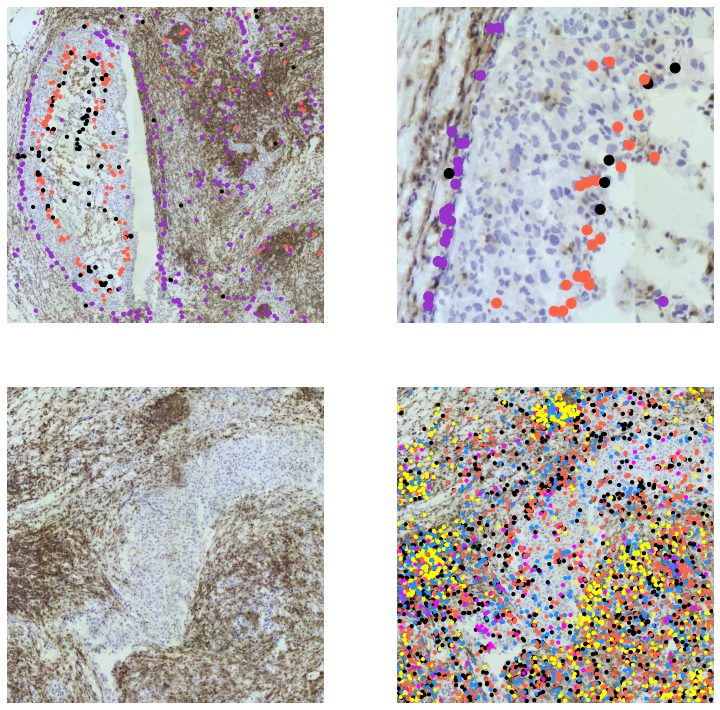

In [37]:
plt.rcParams['figure.facecolor'] = 'w'

fig, axs = plt.subplots(2,2,figsize=(8*2*0.8,8*2*0.8))


axs[0,0].imshow(img_dapi_CD45_cut[0])
colors =  ['tomato', 'black', 'darkorchid']
genes = ['CA9','CXCL8', 'CD34']
pos_x = []
pos_y = []
p_color = []
for i, allele in enumerate(genes):
    pos_x.append(df_imm_cut[0].X[df_imm_cut[0].Name == allele])
    pos_y.append(df_imm_cut[0].Y[df_imm_cut[0].Name == allele])
    p_color.append([colors[i]]*(df_imm_cut[0].Name == allele).sum())
pos_x = np.concatenate(pos_x)
pos_y = np.concatenate(pos_y)
p_color = np.concatenate(p_color)
p_order = np.random.permutation(p_color.shape[0])
axs[0,0].scatter(pos_x[p_order], pos_y[p_order], color=p_color[p_order], s=10) 
axs[0,0].set_aspect('equal')
axs[0,0].axis('off')

axs[0,1].imshow(img_dapi_CD45_cut[1])
colors = ['tomato', 'black', 'darkorchid']
genes = ['CA9','CXCL8', 'CD34']
pos_x = []
pos_y = []
p_color = []
for i, allele in enumerate(genes):
    pos_x.append(df_imm_cut[1].X[df_imm_cut[1].Name == allele])
    pos_y.append(df_imm_cut[1].Y[df_imm_cut[1].Name == allele])
    p_color.append([colors[i]]*(df_imm_cut[1].Name == allele).sum())
pos_x = np.concatenate(pos_x)
pos_y = np.concatenate(pos_y)
p_color = np.concatenate(p_color)
p_order = np.random.permutation(p_color.shape[0])
axs[0,1].scatter(pos_x[p_order], pos_y[p_order], color=p_color[p_order], s=100)#, marker='+') 
axs[0,1].set_aspect('equal')
axs[0,1].axis('off')

axs[1,0].imshow(img_dapi_CD45_cut[2])
axs[1,0].set_aspect('equal')
axs[1,0].axis('off')


axs[1,1].imshow(img_dapi_CD45_cut[2])
colors = []
for i, group in enumerate(['Bcell', 'CD8_cytotoxic', 'macrophage', 'monocyte', 'Treg']):
    colors += [['yellow', 'magenta', 'black', 'tomato', 'dodgerblue'][i]] * len(group2genes[group])
genes = []
for group in ['Bcell', 'CD8_cytotoxic', 'macrophage', 'monocyte', 'Treg']:
    genes += group2genes[group]
pos_x = []
pos_y = []
p_color = []
for i, allele in enumerate(genes):
    pos_x.append(df_imm_cut[2].X[df_imm_cut[2].Name == allele])
    pos_y.append(df_imm_cut[2].Y[df_imm_cut[2].Name == allele])
    p_color.append([colors[i]]*(df_imm_cut[2].Name == allele).sum())
pos_x = np.concatenate(pos_x)
pos_y = np.concatenate(pos_y)
p_color = np.concatenate(p_color)
p_order = np.random.permutation(p_color.shape[0])
axs[1,1].scatter(pos_x[p_order], pos_y[p_order], color=p_color[p_order], s=10)#, marker='+') 
axs[1,1].set_aspect('equal')
axs[1,1].axis('off')
#plt.savefig(f'./images/Fig5I-L.pdf'.format(i))


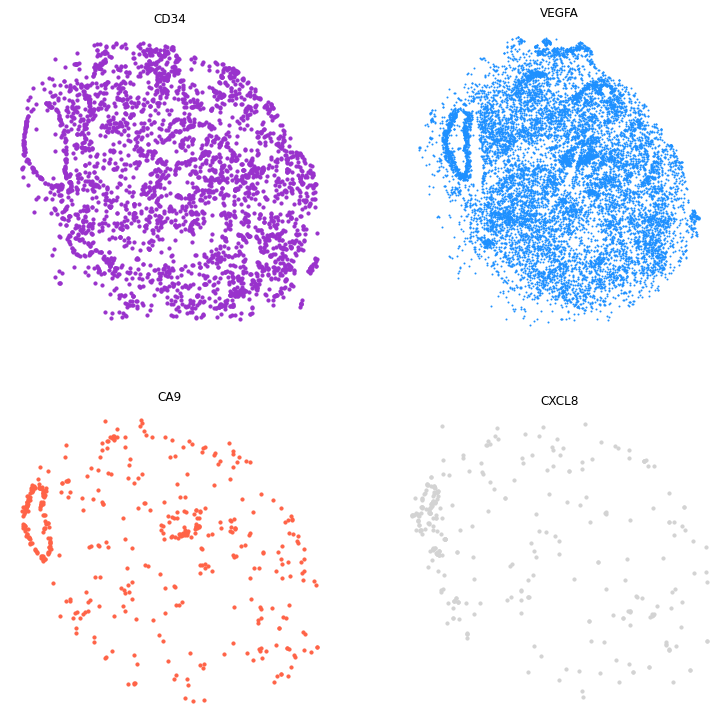

In [43]:
plt.rcParams['figure.facecolor'] = 'white'

df_imm = pd.read_csv('/nfs/research1/gerstung/mg617/ISS_data/Imm_PD14780e2/decoding/Imm_PD14780e2_GMMdecoding.csv')
df_imm = df_imm[df_imm.Probability > 0.6]
df_exp = pd.read_csv('/nfs/research1/gerstung/mg617/ISS_data/Exp_PD14780e2/decoding/Exp_PD14780e2_GMMdecoding.csv')
df_exp = df_exp[df_exp.Probability > 0.6]

immune_genes = ['CD34','VEGFA', 'CA9', 'CXCL8']

colors = ['darkorchid', 'dodgerblue', 'tomato', 'lightgrey']
s = [10, 1, 10, 10]
panel = [df_imm, df_exp, df_imm, df_imm]

fig, axs = plt.subplots(2,2,figsize=(8*2*0.8, 8*2*0.8))

for i in range(len(immune_genes)):
    axs.flatten()[i].scatter(panel[i].X[panel[i].Name == immune_genes[i]],
                     panel[i].Y[panel[i].Name == immune_genes[i]], s=s[i], color=colors[i])   
    axs.flatten()[i].set_aspect('equal')
    axs.flatten()[i].axis('off')
    axs.flatten()[i].set_facecolor('black')
    axs.flatten()[i].invert_yaxis()
    axs.flatten()[i].set_title(immune_genes[i])

#plt.savefig(f'./images/Fig5K.pdf'.format(i))


## Fig. S6. Heatmap of clinical recurrence assay gene group expression across 8 transition points in 2 cancers.

Each tile represents the relative expression of the gene ‘group’ as included in
the 21 gene recurrence assay for breast cancer (Paik et al. NEJM, 2004): Invasion - MMP11,
CTSL2; Proliferation = CCNB1, MKI67, STK15, Survivin, MYBL2; ER = ER, PGR, BCL2,
SCUBE2; GRB7= HER2, GRB7. Relative weightings are described in Extended Methods section
8.5. Each ‘transition’ is represented by a number above the heatmap and corresponding
phylogenetic tree and reports either a direct clonal succession event within a cancer lineage
(1,3,5,7,8), the progression from DCIS (intraductal) to invasion (extraductal) (4,6) or competition
from a divergent clone (2). White arrows indicate statistically significant fold changes between
tiles (PPLR<0.01, Bonferroni adjusted). Proliferation changes consistently accompany the
predicted pattern of clonal succession in 7 cases. The exception (transition 1) reflects the green
pure DCIS clone that succeeded blue and it is likely that the blue clone has acquired additional
unsampled mutations (below detection of WGS), furthermore, the green clone was clinically nonprogressive.

In [45]:
with open('../pymc_model/data/absolute_exp_processed_dict_case1.pkl', 'rb') as file:
    exp_absolute_case1 = pkl.load(file)

In [46]:
with open('../pymc_model/data/absolute_exp_processed_dict_case2.pkl', 'rb') as file:
    exp_absolute_case2 = pkl.load(file)

In [47]:
subclones = np.concatenate([exp_absolute_case1['subclones'], exp_absolute_case2['subclones']])

In [48]:
total_counts_case1 = pd.read_csv('../pymc_model/data/subcl_iss_counts_case1.csv')
total_counts_case2 = pd.read_csv('../pymc_model/data/subcl_iss_counts_case2.csv')
total_counts_case1['subclone_id'] = total_counts_case1['subclone'] + '-' + [i[-1] for i in total_counts_case1['sample']]
total_counts_case2['subclone_id'] = total_counts_case2['subclone'] + '-' + [i[-1] for i in total_counts_case2['sample']]

subclones = np.concatenate([exp_absolute_case1['subclones'], exp_absolute_case2['subclones']])
subclones = subclones[[12,13,14,15,0,1,2,3,4,5,8,6,7][::-1]]

total_counts = pd.concat([total_counts_case1.pivot(index='subclone_id', columns=['gene', 'panel'], values='ISS counts'),
                          total_counts_case2.pivot(index='subclone_id', columns=['gene', 'panel'], values='ISS counts')])

total_counts = total_counts.loc[subclones]

In [49]:
subcl_gene_means = np.array([exp_absolute_case1['vals'][s].mean(axis=0) for s in exp_absolute_case1['vals'].keys()] + [exp_absolute_case2['vals'][s].mean(axis=0) for s in exp_absolute_case2['vals'].keys()])
subcl_gene_means_df = pd.DataFrame(subcl_gene_means,
             index=np.concatenate([exp_absolute_case1['subclones'], exp_absolute_case2['subclones']]),
             columns = exp_absolute_case1['gene_names'])

gene_names = exp_absolute_case1['gene_names']
subcl_gene_means_df = subcl_gene_means_df.loc[subclones]

In [50]:
oncotypes = {'GRB7':'grb7' , 'HER2':'grb7',
             'ER':'er', 'PR':'er', 'BCL2':'er', 'SCUBE2':'er',
             'BIRC5':'proliferation', 'MKI67':'proliferation', 'MYBL2':'proliferation', 'CCNB1':'proliferation', 'STK15':'proliferation',
             'CTSL2': 'invasion', 'MMP11': 'invasion'}

names = gene_names

def grb7_groupscore(arr, names=names):
    arr = arr.T
    out_arr = np.zeros(arr.shape[1:])
    out_arr += arr[np.where(names == 'GRB7')[0][0]] * 0.9
    out_arr += arr[np.where(names == 'HER2')[0][0]] * 0.1
    #out_arr[out_arr<8] = 8
    return out_arr.T

def er_groupscore(arr, names=names):
    arr = arr.T
    out_arr = np.zeros(arr.shape[1:])
    out_arr += arr[np.where(names == 'ER')[0][0]] * 0.2
    out_arr += arr[np.where(names == 'PR')[0][0]] * 0.3
    out_arr += arr[np.where(names == 'BCL2')[0][0]] * 0.25
    out_arr += arr[np.where(names == 'SCUBE2')[0][0]] * 0.25
    return out_arr.T

def proliferation_groupscore(arr, names=names):
    arr = arr.T
    out_arr = np.zeros(arr.shape[1:])
    out_arr += arr[np.where(names == 'BIRC5')[0][0]] * 0.2
    out_arr += arr[np.where(names == 'MKI67')[0][1]] * 0.2
    out_arr += arr[np.where(names == 'MYBL2')[0][0]] * 0.2
    out_arr += arr[np.where(names == 'CCNB1')[0][0]] * 0.2
    out_arr += arr[np.where(names == 'STK15')[0][0]] * 0.2
    #out_arr[out_arr < 6.5] = 6.5
    return out_arr.T

def invasion_groupscore(arr, names=names):
    arr = arr.T
    out_arr = np.zeros(arr.shape[1:])
    out_arr += arr[np.where(names == 'CTSL2')[0][0]] * 0.5
    out_arr += arr[np.where(names == 'MMP11')[0][0]] * 0.5
    return out_arr.T

def calc_exp_difference(data, subclones, gene_to_process=None, th=0.01, m_mht=None):
    if gene_to_process is None:
        data_prepared = np.transpose(np.array([data[k] for k in subclones]), [1,0,2])
    else:
        data_prepared = np.transpose(np.array([data[k][:,gene_to_process] for k in subclones]), [1,0,2])
        
    pval = np.ones((data_prepared.shape[1], data_prepared.shape[1], data_prepared.shape[2]))
    direction = np.ones((data_prepared.shape[1], data_prepared.shape[1], data_prepared.shape[2]))
    for i in range(data_prepared.shape[1]):
        for j in range(data_prepared.shape[1]):
            pval[i,j,:] = pplr(data_prepared[:,i,:], data_prepared[:,j,:],by=1)
            direction[i,j,:] = data_prepared[:,i,:].mean(axis=0) - data_prepared[:,j,:].mean(axis=0)
            
    if not m_mht is None:
        pval = bonferonni(pval, m=m_mht)
    is_different = pval
    is_up = (direction > 0)*2 -1 
    
    return is_up * is_different


In [51]:
full_samples = np.array([exp_absolute_case1['vals'][s] for s in exp_absolute_case1['vals'].keys()] + [exp_absolute_case2['vals'][s] for s in exp_absolute_case2['vals'].keys()])
full_samples = full_samples[[12,13,14,15,0,1,2,3,4,5,8,6,7][::-1]]

In [52]:
scores_full = np.array([grb7_groupscore(full_samples),
                   er_groupscore(full_samples),
                   proliferation_groupscore(full_samples),
                   invasion_groupscore(full_samples)])
scores_full = np.transpose(scores_full, [2,1,0])
scores_full_dict = {k:scores_full[:,i,:] for i, k in enumerate(subclones)}

In [53]:
diffs = calc_exp_difference(scores_full_dict, subclones, m_mht=full_samples.shape[0] * 4)

In [54]:
subcl_gene_means_df_log = np.log2(subcl_gene_means_df).values

In [55]:
scores = np.array([grb7_groupscore(subcl_gene_means_df_log),
                   er_groupscore(subcl_gene_means_df_log),
                   proliferation_groupscore(subcl_gene_means_df_log),
                   invasion_groupscore(subcl_gene_means_df_log)])

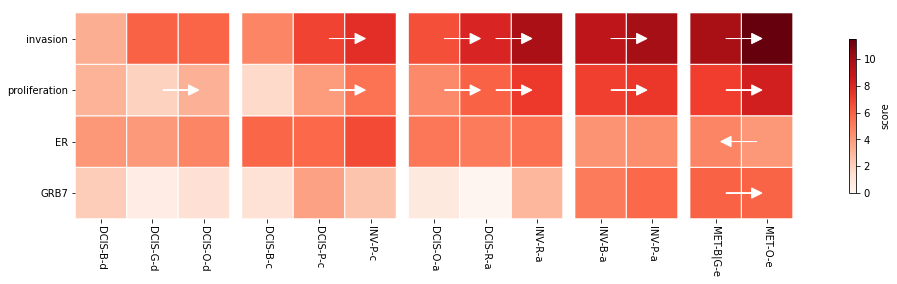

In [56]:
split = [(0,2), (3,5), (6,8), (9,10), (11,12)]
pairs = {0:[(0,1), (1,2)],
         1:[(3,4), (4,5)],
         2:[(6,7), (7,8)],
         3:[(9,10)],
         4:[(11,12)]}

n,m = scores.shape
scores_shift = scores-scores.min()
v_max = scores_shift.max()
fig, axs = plt.subplots(1, len(split)+1, figsize=(m+1,n), gridspec_kw={'width_ratios':([s[1]-s[0]+1 for s in split]+[1]), 'wspace':0.1}, sharey=True)
for i, s in enumerate(split):
    hmap = axs[i].pcolor(scores_shift[:,s[0]:s[1]+1], cmap='Reds', edgecolors='white', linewidths=1, vmin=0, vmax=v_max)
    for y_ar in range(n):
        for pair in pairs[i]:
            test = np.abs(diffs[pair[0], pair[1], y_ar])
            sign = np.sign(diffs[pair[0], pair[1], y_ar])
            if test < 0.01:
                if sign < 0:
                    axs[i].arrow(pair[0] - s[0]+0.5+0.2, y_ar+0.5, 0.5, 0, head_width=0.2, head_length=0.2, alpha=1, color='white')
                else:
                    axs[i].arrow(pair[1] - s[0]+0.5-0.2, y_ar+0.5, -0.5, 0, head_width=0.2, head_length=0.2, alpha=1, color='white')
    axs[i].set_xticks(np.arange(s[1]-s[0]+1)+0.5)
    axs[i].set_xticklabels(subclones[s[0]:s[1]+1], rotation=-90)
    axs[i].spines['right'].set_visible(False)
    axs[i].spines['top'].set_visible(False)
    axs[i].spines['left'].set_visible(False)
    axs[i].spines['bottom'].set_visible(False)
    if i != 0:
        axs[i].axes.yaxis.set_visible(False)
    axs[i].set_aspect('equal')


axs[0].set_yticks(np.arange(scores.shape[0])+0.5)
axs[0].set_yticklabels(['GRB7', 'ER', 'proliferation', 'invasion'])
axs[-1].axis('off')
fig.colorbar(hmap, ax=[axs[5]], location='right', label='score')
#plt.savefig(f'./images/Fig4G.pdf')
#plt.colorbar()

## Fig. S2 Mapping cancer mutations in tissue context case PD9694 (A-C)

Scatterplots of BaSISS variant allele frequencies (VAF) defined as number of mutation specific signals divided by
mutation plus wildtype signals (depth) for each mutation target: (A) Compared to WGS VAF, (C)
compared to WGS VAF after applying a probe specific adjustment (VAF)as described in methods
section 7.4.1, (C) between replicate BaSISS experiments. R = Pearson’s correlation coefficient.

In [3]:
with open('./data/newdata_saved.pkl', 'rb') as file:
    saved_lists = pkl.load(file)
mut_sample_list_case1 = saved_lists['mut_sample_list']
val_sample_list_case1 = saved_lists['val_sample_list']

In [11]:
wgs_data = pd.read_csv('./data/PD9694_genome_data_dec_2020.csv')
wgs_data = wgs_data[np.isin(wgs_data.ISS_id, [x[:-2] for x in mut_sample_list_case1[0].genes])]
gene_names = wgs_data.ISS_id



scale = 3
mask = mask_infisble(mut_sample_list_case1[:3], scale, probability=0.6, plot=False)
mask_val = mask_infisble(val_sample_list_case1[:3], scale, probability=0.6, plot=False)

for i in range(3):
    mut_sample_list_case1[i].data_to_grid(scale_factor=scale)
    mask_infisiable = mask[i]
    mask_infisiable_val = mask_val[i]
    mut_sample_list_case1[i].data_to_grid(scale_factor=scale, probability=0.6)
    val_sample_list_case1[i].data_to_grid(scale_factor=scale, probability=0.6)
    wgs_data[f'PD9694{["d", "a", "c"][i]}_mut_counts'] = [mut_sample_list_case1[i].gene_grid[name+'mut'].flatten()[mask_infisiable].sum() for name in gene_names]
    wgs_data[f'PD9694{["d", "a", "c"][i]}_wt_counts'] = [mut_sample_list_case1[i].gene_grid[name+'wt'].flatten()[mask_infisiable].sum() for name in gene_names]
    wgs_data[f'PD9694{["d", "a", "c"][i]}_mut_counts_VAL'] = [val_sample_list_case1[i].gene_grid[name+'mut'].flatten()[mask_infisiable_val].sum() for name in gene_names]
    wgs_data[f'PD9694{["d", "a", "c"][i]}_wt_counts_VAL'] = [val_sample_list_case1[i].gene_grid[name+'wt'].flatten()[mask_infisiable_val].sum() for name in gene_names]
genes_data = wgs_data

vaf_comp = []
for s in 'dac':
    genes_data[f'depth_{s}'] = genes_data[f'DIS_sample_PD9694{s}_depth']
    genes_data[f'seqdepth_{s}'] = genes_data[f'VAL_sample_PD9694{s}_depth']
    genes_data[f'PD9694{s}_mut_reads'] = genes_data[f'DIS_MtAll_PD9694{s}']
    genes_data[f'PD9694{s}_wt_reads'] = genes_data[f'DIS_sample_PD9694{s}_depth'] - genes_data[f'DIS_MtAll_PD9694{s}']
    genes_data[f'PD9694{s}_mut_seqs'] = genes_data[f'VAL_MtAll_PD9694{s}']
    genes_data[f'PD9694{s}_wt_seqs'] = genes_data[f'VAL_sample_PD9694{s}_depth'] - genes_data[f'VAL_MtAll_PD9694{s}']
    genes_data[f'ratio_iss_{s}'] = genes_data[f'PD9694{s}_mut_counts']/(genes_data[f'PD9694{s}_mut_counts'] + genes_data[f'PD9694{s}_wt_counts'])
    genes_data[f'ratio_iss_{s}_VAL'] = genes_data[f'PD9694{s}_mut_counts_VAL']/(genes_data[f'PD9694{s}_mut_counts_VAL'] + genes_data[f'PD9694{s}_wt_counts_VAL'])
    genes_data[f'ratio_wgs_{s}'] = genes_data[f'PD9694{s}_mut_reads']/(genes_data[f'PD9694{s}_wt_reads'] + genes_data[f'PD9694{s}_mut_reads'])
    genes_data[f'ratio_dna_{s}'] = genes_data[f'PD9694{s}_mut_seqs']/(genes_data[f'PD9694{s}_wt_seqs'] + genes_data[f'PD9694{s}_mut_seqs'])
    genes_data[f'counts_{s}'] = (genes_data[f'PD9694{s}_mut_counts'] + genes_data[f'PD9694{s}_wt_counts'])
    genes_data[f'counts_{s}_VAL'] = (genes_data[f'PD9694{s}_mut_counts_VAL'] + genes_data[f'PD9694{s}_wt_counts_VAL'])
    vaf_comp.append(genes_data[['ISS_id', f'ratio_dna_{s}', f'ratio_wgs_{s}', f'ratio_iss_{s}', f'seqdepth_{s}', f'depth_{s}', f'counts_{s}', f'ratio_iss_{s}_VAL', f'counts_{s}_VAL']])
    vaf_comp[-1].columns = ['ISS_id', f'ratio_dna', f'ratio_wgs', f'ratio_iss','dna_depth', 'wgs_depth', 'iss_depth_counts', 'ratio_iss_VAL', 'iss_depth_counts_VAL']
    

100%|██████████| 56/56 [00:00<00:00, 70.98it/s]


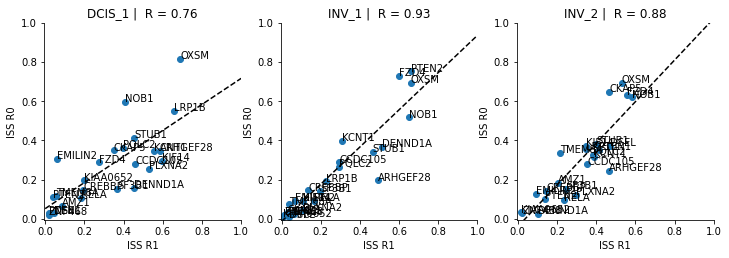

In [14]:
plt.rcParams['figure.facecolor'] = 'white'
mpl.rcParams['pdf.fonttype'] = 42

plt.figure(figsize=(12,4))

for s in range(3):
    plt.subplot(1,3,s+1)
    coef = np.polyfit(vaf_comp[s].ratio_iss_VAL, vaf_comp[s].ratio_iss,1)
    poly1d_fn = np.poly1d(coef) 
    slope, intercept, r_value, p_value, std_err = stats.linregress(vaf_comp[s].ratio_iss_VAL, vaf_comp[s].ratio_iss)

    plt.scatter(vaf_comp[s]['ratio_iss_VAL'], vaf_comp[s]['ratio_iss'])
    for i in range(vaf_comp[s].shape[0]):
        plt.text(vaf_comp[s]['ratio_iss_VAL'].iloc[i], vaf_comp[s]['ratio_iss'].iloc[i], vaf_comp[s]['ISS_id'].iloc[i])
        
    
    plt.plot(np.linspace(0, 1, 10), poly1d_fn(np.linspace(0, 1, 10)), '--', c='black')
    plt.title(['DCIS_1', 'INV_1', 'INV_2'][s] + ' |  R = {}'.format(round(r_value, 2)))
    plt.xlabel('ISS R1')
    plt.ylabel('ISS R0')
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['top'].set_visible(False)
    plt.xlim(0-0.005,1)
    plt.ylim(0-0.005,1)
    plt.gca().set_aspect('equal')
    #plt.savefig(f'./images/Supp2C.pdf')

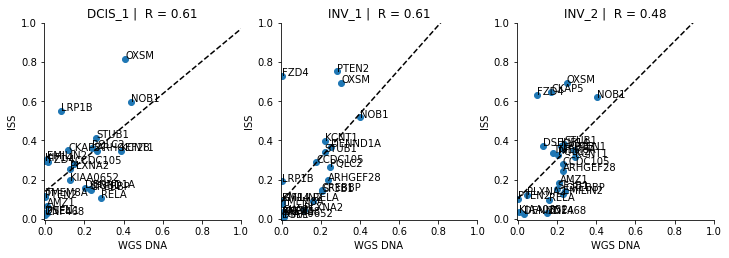

In [6]:
plt.rcParams['figure.facecolor'] = 'white'
plt.figure(figsize=(12,4))

for s in range(3):
    plt.subplot(1,3,s+1)
    coef = np.polyfit(vaf_comp[s].ratio_dna, vaf_comp[s].ratio_iss,1)
    poly1d_fn = np.poly1d(coef) 
    slope, intercept, r_value, p_value, std_err = stats.linregress(vaf_comp[s].ratio_dna, vaf_comp[s].ratio_iss)
 
    plt.scatter(vaf_comp[s]['ratio_dna'], vaf_comp[s]['ratio_iss'])
    for i in range(vaf_comp[s].shape[0]):
        plt.text(vaf_comp[s]['ratio_dna'].iloc[i], vaf_comp[s]['ratio_iss'].iloc[i], vaf_comp[s]['ISS_id'].iloc[i])
        
    
    plt.plot(np.linspace(0, 1, 10), poly1d_fn(np.linspace(0, 1, 10)), '--', c='black')
    plt.title(['DCIS_1', 'INV_1', 'INV_2'][s] + ' |  R = {}'.format(round(r_value, 2)))
    plt.xlabel('WGS DNA')
    plt.ylabel('ISS')
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['top'].set_visible(False)
    plt.xlim(0-0.005,1)
    plt.ylim(0-0.005,1)
    plt.gca().set_aspect('equal')
    #plt.savefig(f'./images/Supp2D.pdf')

In [7]:
with open('./data/model_2805_final_30-01.pkl', 'rb') as file:
    samples_hierarchical_errosion_case1 = pkl.load(file)


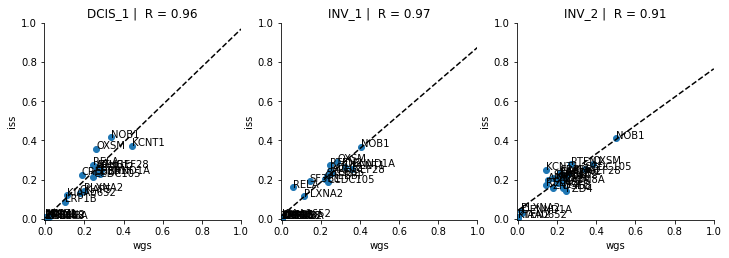

In [9]:
tree = pd.read_csv('./tree_data/final_matrix6_case1.csv')
tree.columns = ['SF3B1mut', 'STUB1mut', 'CREBBPmut', 'ARHGEF28mut', 'KIAA0652mut',
       'OXSMmut', 'CKAP5mut', 'DENND1Amut', 'NOB1mut', 'RELAmut', 'PLXNA2mut',
       'PQLC2mut', 'LRP1Bmut', 'PTEN1mut', 'PTEN2mut', 'TMEM8Amut', 'DSELmut',
       'FGFR1exp', 'KIF14mut', 'AMZ1mut', 'KCNT1mut', 'FZD4mut', 'AP3B22mut',
       'EMILIN2mut', 'CCDC105mut', 'ZNF468mut', 'SF3B1wt', 'STUB1wt',
       'CREBBPwt', 'ARHGEF28wt', 'KIAA0652wt', 'OXSMwt', 'CKAP5wt',
       'DENND1Awt', 'NOB1wt', 'RELAwt', 'PLXNA2wt', 'PQLC2wt', 'LRP1Bwt',
       'PTEN1wt', 'PTEN2wt', 'TMEM8Awt', 'DSELwt', 'KIF14wt', 'AMZ1wt',
       'KCNT1wt', 'FZD4wt', 'AP3B2wt', 'EMILIN2wt', 'CCDC105wt', 'ZNF468wt']


plt.figure(figsize=(12,4))
genes_data = wgs_data

vaf_comp = []
for i, s in enumerate('dac'):
    genes_data[f'PD9694{["d", "a", "c"][i]}_mut_counts'] = [mut_sample_list_case1[i].gene_grid[name+'mut'].flatten()[mask[i]].sum() for name in genes_data[f'ISS_id']]
    genes_data[f'PD9694{["d", "a", "c"][i]}_wt_counts'] = [mut_sample_list_case1[i].gene_grid[name+'wt'].flatten()[mask[i]].sum() for name in genes_data[f'ISS_id']]

    af = samples_hierarchical_errosion_case1[f'theta_{i}'].mean(axis=0).sum(axis=0)
    genes_data[f'depth_{s}'] = genes_data[f'DIS_sample_PD9694{s}_depth']
    genes_data[f'seqdepth_{s}'] = genes_data[f'VAL_sample_PD9694{s}_depth']
    genes_data[f'T_{s}'] = [af[np.where(tree.columns == iss_id + 'mut')[0][0]] \
                            / (af[np.where(tree.columns == iss_id + 'wt')[0][0]] \
                               +af[np.where(tree.columns == iss_id + 'mut')[0][0]]) for iss_id in genes_data[f'ISS_id']]
    genes_data[f'PD9694{s}_mut_reads'] = genes_data[f'DIS_MtAll_PD9694{s}']
    genes_data[f'PD9694{s}_wt_reads'] = genes_data[f'DIS_sample_PD9694{s}_depth'] - genes_data[f'DIS_MtAll_PD9694{s}']
    genes_data[f'PD9694{s}_mut_seqs'] = genes_data[f'VAL_MtAll_PD9694{s}']
    genes_data[f'PD9694{s}_wt_seqs'] = genes_data[f'VAL_sample_PD9694{s}_depth'] - genes_data[f'VAL_MtAll_PD9694{s}']
    genes_data[f'ratio_iss_{s}'] = genes_data[f'PD9694{s}_mut_counts'] /(genes_data[f'PD9694{s}_mut_counts'] + genes_data[f'PD9694{s}_wt_counts'] )
    genes_data[f'ratio_wgs_{s}'] = genes_data[f'PD9694{s}_mut_reads']/(genes_data[f'PD9694{s}_wt_reads'] + genes_data[f'PD9694{s}_mut_reads'])
    genes_data[f'ratio_dna_{s}'] = genes_data[f'PD9694{s}_mut_seqs']/(genes_data[f'PD9694{s}_wt_seqs'] + genes_data[f'PD9694{s}_mut_seqs'])
    genes_data[f'counts_{s}'] = (genes_data[f'PD9694{s}_mut_counts'] + genes_data[f'PD9694{s}_wt_counts'])
    vaf_comp.append(genes_data[['ISS_id', f'ratio_dna_{s}', f'ratio_wgs_{s}', f'T_{s}', f'seqdepth_{s}', f'depth_{s}']])
    vaf_comp[-1].columns = ['ISS_id', f'ratio_dna', f'ratio_wgs', f'ratio_iss_infered','dna_depth', 'wgs_depth']


for s in range(3):
    plt.subplot(1,3,s+1)
    coef = np.polyfit(vaf_comp[s].ratio_wgs, vaf_comp[s].ratio_iss_infered,1)
    poly1d_fn = np.poly1d(coef) 
    slope, intercept, r_value, p_value, std_err = stats.linregress(vaf_comp[s].ratio_wgs, vaf_comp[s].ratio_iss_infered)

    plt.scatter(vaf_comp[s]['ratio_wgs'], vaf_comp[s]['ratio_iss_infered'])
    for i in range(vaf_comp[s].shape[0]):
        plt.text(vaf_comp[s]['ratio_wgs'].iloc[i], vaf_comp[s]['ratio_iss_infered'].iloc[i], vaf_comp[s]['ISS_id'].iloc[i])
        
    
    plt.plot(np.linspace(0, 1, 10), poly1d_fn(np.linspace(0, 1, 10)), '--', c='black')
    plt.title(['DCIS_1', 'INV_1', 'INV_2'][s] + ' |  R = {}'.format(round(r_value, 2)))
    plt.xlabel('wgs')
    plt.ylabel('iss')
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['top'].set_visible(False)
    plt.xlim(0-0.005,1)
    plt.ylim(0-0.005,1)
    plt.rcParams['figure.facecolor'] = 'w'
    plt.gca().set_aspect('equal')
    #plt.savefig(f'./images/Supp2E.pdf')

## Fig. S3. Case PD9694 clone specific characteristics (B)

<b>(B)</b> Stacked barplot of cancer
clone composition of ‘spaces’ in PD9694d. Anatomically contiguous spaces (acini and ducts) are
manually defined according to the presence of myoepithelial borders and/or intervening stroma
(white borders represented on clone map). Regions containing >=500 cells are included in the
analysis.

In [71]:
with open('../pymc_model/data/newdata_saved.pkl', 'rb') as file:
    saved_lists = pkl.load(file)
mut_sample_list_case1 = saved_lists['mut_sample_list']

with open('../pymc_model/data/model_2805_final_30-01.pkl', 'rb') as file:
    samples_hierarchical_errosion_case1 = pkl.load(file)

In [72]:
mut_sample_list_case1[0].data_to_grid(3, probability=0.6)
sample_d_data = mut_sample_list_case1[0]

gfields_d = samples_hierarchical_errosion_case1['F_0'].reshape(300, *sample_d_data.grid_params, 9)
cell_densities_d = samples_hierarchical_errosion_case1['lm_n_0'].reshape(300, *sample_d_data.grid_params)

100%|██████████| 56/56 [00:03<00:00, 15.81it/s]


In [73]:
rescale_xy = sample_d_data.grid_params / np.array(mut_sample_list_case1[0].spatial_dims)

In [78]:
paths = mut_sample_list_case1[0].ducts['paths']

In [79]:
paths_matplot = [mpltPath.Path(paths[i]* rescale_xy) for i in range(len(paths))]

In [80]:
xg1, yg1 = np.meshgrid(np.arange(sample_d_data.grid_params[0]), np.arange(sample_d_data.grid_params[1]))
xg1, yg1 = xg1.flatten(), yg1.flatten()
paths_matplot = [mpltPath.Path(paths[i]* rescale_xy) for i in range(len(paths))]
dots_within_paths = []
for i in range(len(paths)):
    dots_within = paths_matplot[i].contains_points(np.array([xg1, yg1]).T, radius=1)
    dots_within_paths.append(dots_within)

In [81]:
subclone_proportions = []
subclone_cell_densities = []
for i in range(len(paths)):
    x = xg1[dots_within_paths[i]]
    y = yg1[dots_within_paths[i]]
    
    pcts = []
    for pct in [5, 50, 95]:
        cell_numbers = np.percentile(gfields_d[:, x, y, :6] * cell_densities_d[:, x, y, None], pct, axis=0).sum(axis=0)
        cell_numbers = cell_numbers/cell_numbers.sum(axis=0, keepdims=True)
        
        pcts.append(cell_numbers)

    subclone_cell_densities.append(cell_densities_d[:, x, y].mean(axis=0).sum(axis=0))
    subclone_proportions.append(pcts)
    
subclone_proportions = np.stack(subclone_proportions)

In [82]:
from scipy.spatial.distance import cosine, euclidean
from functools import cmp_to_key

ys = subclone_proportions[:,1]

In [83]:
ys = subclone_proportions[:,0]
order=np.argsort(ys[:,5])
order = order[np.array(subclone_cell_densities)[order] > 500]
ys=ys[order,:]
ys.shape

(79, 6)

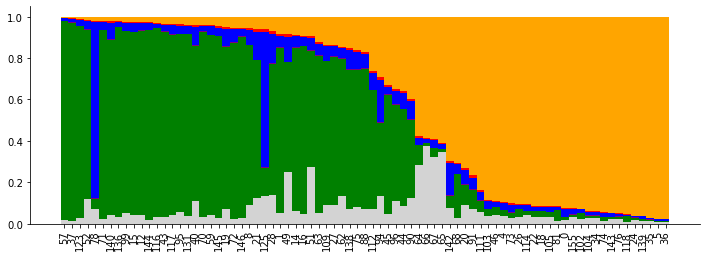

In [84]:
ys = subclone_proportions[:,0]
#ys_low = subclone_proportions[:,0]
#ys_high = subclone_proportions[:,2]
order=np.argsort(ys[:,5])
order = order[np.array(subclone_cell_densities)[order] > 500]
ys=ys[order,:]
ycumpos = np.concatenate([np.zeros(len(ys))[:,None], np.cumsum(ys, axis=1)], axis=1)
#ycumposl = np.concatenate([[0], np.cumsum(ys_low)])
#ycumposh = np.concatenate([[0], np.cumsum(ys_high)])
xbarpos = np.arange(ys.shape[0])

colors = ['lightgrey', 'green', 'purple', 'blue', 'red', 'orange']

plt.figure(figsize=(12,4))
for i in range(ys.shape[1]):
    plt.bar(xbarpos, ys[:,i], bottom=ycumpos[:,i], color=colors[i],width=1)
    #if i == len(ys)-1:
    #    plt.bar(0, ys[i], bottom=ycumpos[i], color=colors[i])
    #else:
    #     plt.bar(0, ys[i], bottom=ycumpos[i], color=colors[i], yerr=np.array([ys_low[i], ys_high[i]])[:,None])
plt.xticks(xbarpos, order, rotation=90)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
#plt.savefig(f'./images/SuppFig3B_stacked_barplot.pdf'.format(i))
plt.show()

(-0.5, 3749.5, -0.5, 2365.5)

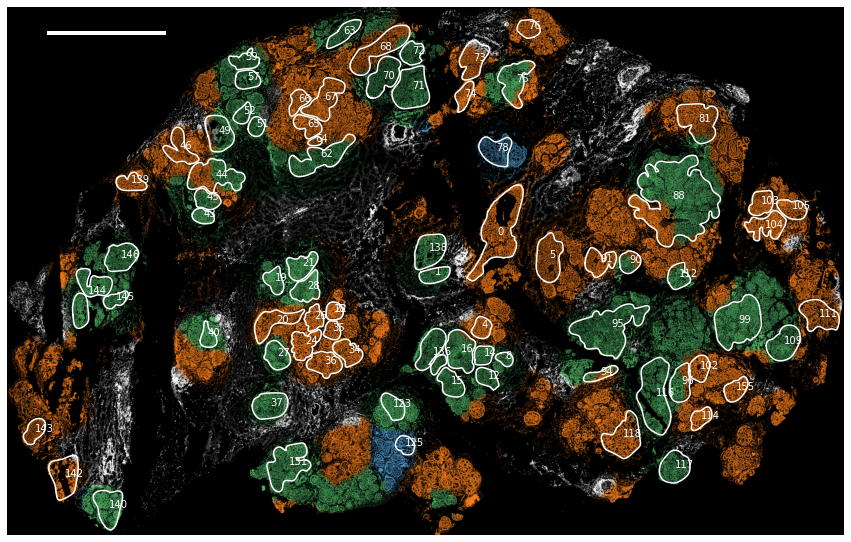

In [85]:
plt.figure(figsize=(15,15))
df_mut = pd.DataFrame(mut_sample_list_case1[0].data)
colors = {'cls-1':'white', 'cls-2':'grey', 'cls-3':'red', 'cls-4':'purple', 'cls-5':'black'}
paths = mut_sample_list_case1[0].ducts['paths']
duct_type = mut_sample_list_case1[0].ducts['linetype']
for i in range(len(paths)):
    if i in order:
        plt.text(paths[i][:,0].mean()/15, paths[i][:,1].mean()/15,i, color='white')
        plt.plot(paths[i][:,0]/15, paths[i][:,1]/15, color=colors[duct_type[i]])
#plt.scatter(df_mut.PosX[df_mut.Gene == 'KIAA0652mut'], df_mut.PosY[df_mut.Gene == 'KIAA0652mut'], color='red', s=10, alpha=1)

pixel2um = 0.325

cmaps = {'grey':"Greys", 'green':"Greens", 'purple':"Purples",'magenta':"RdPu",'blue':"Blues",'red':"Reds",'orange':"YlOrBr",'wt':"Greys", 'residuals':"Greys"}

names = ['grey','green', 'purple', 'blue', 'red','orange'] + 2 * ['wt']

sample_dims = mut_sample_list_case1[0].grid_params

#c = [mpl.colors.to_rgb(n) for n in names]
c = [get_cmap(cmaps[n])(150) for n in names]
n_factors=8
#c[0] = get_cmap("cool")(10)
n_samples=5
selected_sample = 0
F = samples_hierarchical_errosion_case1[f'F_{selected_sample}'].mean(0).reshape(*sample_dims,-1) 
Fmap = (F[:,:,:n_factors-2]).argmax(2) 
Fn = (F[:,:,n_factors-2:]).sum(2) > [0.75, 0.75, 0.75][selected_sample]
n = samples_hierarchical_errosion_case1[f'lm_n_{selected_sample}'].mean(0).reshape(*sample_dims).T[::-1, :]

img = mut_sample_list_case1[selected_sample]._scaffold_image #tifffile.imread(mut_sample_list[i].image)
s = img.shape
s = tuple([int(x) for x in list(s)[::-1]])

p35, p90 = np.percentile(img, (35, 90))
processed_img = exposure.rescale_intensity(img, in_range=(p35, p90))
b = cv.resize(processed_img, s)[::-1,:]/255.

b = np.maximum(np.minimum(b,1),0)
Fc = np.array([c[int(i)] for i in Fmap.flatten()]).reshape((*Fmap.shape,-1)).transpose((1,0,2))[::-1,:,:3]
Fc[Fn.T[::-1,:],:]=1.0

scale = s[0]/Fc.shape[1]
scaffold_image_rescale = 15

#axs[0].plot([b.shape[1]*0.9 - 2.5e3 / pixel2um / scaffold_image_rescale, b.shape[1]*0.9], [b.shape[0]*0.95, b.shape[0]*0.95], color='white', lw=5)

plt.plot([b.shape[1]*0.05, b.shape[1]*0.05 + 2.5e3 / 0.325 / 15 ], [b.shape[0] * 0.95, b.shape[0] * 0.95], color='white', lw=4)

plt.imshow((cv.resize(Fc, s) * b.reshape(*b.shape,1))[::-1,::])

plt.gca().axis('off')

#plt.savefig(f'./images/SuppFig5A.pdf'.format(i))

#plt.imshow(mut_sample_list_case1[0]._scaffold_image)
plt.gca().set_aspect('equal', adjustable='box')
plt.gca().invert_yaxis()
plt.gca().axis('off')
#plt.savefig(f'./images/SuppFig3B.pdf'.format(i))

## Fig. 4. Tracing aggressive disease in a lymph node metastasis (C)

<b>(C)</b>
Sample PD14780e, BaSISS/ ISS sequenced lymph node sections stained by IHC with pancytokeratin
(pan-CK, stains cancer cells brown). Whole focus area (pan-CK stained) with overlaid BaSISS
signals.

In [57]:
with open('../pymc_model/data/newdata_case2_saved.pkl', 'rb') as file:
    saved_lists = pkl.load(file)
imm_sample_list_сase2 = saved_lists['imm_sample_list']
exp_sample_list_сase2 = saved_lists['exp_sample_list']
mut_sample_list_сase2 = saved_lists['mut_sample_list']

In [58]:
im_whole =  cv2.imread("../ultra_hd_segmentation/Jessica_images/Mut3068-25 panCK_aligned.tif", cv2.IMREAD_COLOR)
im_whole =  cv2.resize(im_whole, (im_whole.shape[1]*2, im_whole.shape[0]*2))


In [59]:
def cut_df(df, xborders, yborders, gap=10, rescale=True):
    df_cut = df[(df.X > xborders[0]+gap) &
                (df.X < xborders[1]-gap) &
                (df.Y > yborders[0]+gap) &
                (df.Y < yborders[1]-gap)]

    if rescale:
        df_cut.X -= xborders[0]
        df_cut.Y -= yborders[0]
    return df_cut

df_mut = pd.read_csv('/nfs/research1/gerstung/mg617/ISS_data/Mut_PD14780e2/decoding/Mut_PD14780e2_GMMdecoding.csv')

mut_xborders = [np.array([5500, 12500])]

mut_yborders = [np.array([500,8500])]

df_mut = df_mut[df_mut.Probability > 0.6]
df_mut.X = df_mut.X
df_mut.Y = df_mut.Y

df_mut_cut = [cut_df(df_mut, mut_xborders[i], mut_yborders[i]) for i in range(len(mut_xborders))]

img_dapi_mut_cut = [im_whole[slice(*mut_yborders[i]),
                                    slice(*mut_xborders[i])][:,:,[2,1,0]] for i in range(len(mut_xborders))]


/nfs/research1/gerstung/artem/miniconda/envs/PyMC-env/lib/python3.7/site-packages/pandas/core/generic.py:5168: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


(-0.5, 6999.5, 7999.5, -0.5)

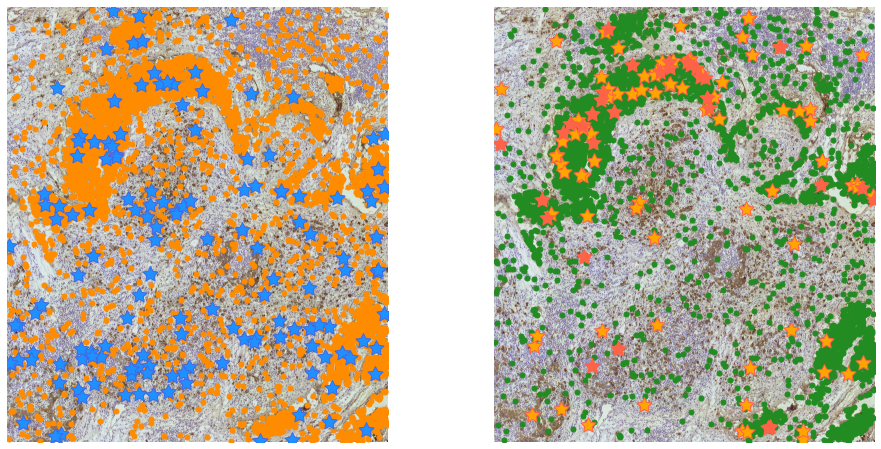

In [60]:
plt.rcParams['figure.facecolor'] = 'w'

fig, axs = plt.subplots(1,2,figsize=(8*2,8*1), sharey=True)

axs[0].imshow(img_dapi_mut_cut[0])

axs[0].scatter(df_mut_cut[0][df_mut_cut[0].Name=='ERBB2wt'].X, df_mut_cut[0][df_mut_cut[0].Name=='ERBB2wt'].Y,
               color='darkorange',s=25,  rasterized=True)
axs[0].scatter(df_mut_cut[0][df_mut_cut[0].Name.isin(['COX19mut', 'TP53mut', 'PLXNA1mut'])].X,
               df_mut_cut[0][df_mut_cut[0].Name.isin(['COX19mut', 'TP53mut', 'PLXNA1mut'])].Y, color='dodgerblue',s=250,marker=(5, 1), linewidth=1, edgecolors='royalblue',  rasterized=True)
axs[0].set_aspect('equal')
#axs[0].invert_yaxis()
axs[0].axis('off')

axs[1].imshow(img_dapi_mut_cut[0])

axs[1].scatter(df_mut_cut[0][df_mut_cut[0].Name=='ERBB2mut'].X,
               df_mut_cut[0][df_mut_cut[0].Name=='ERBB2mut'].Y, color='forestgreen',s=25,  rasterized=True)   
axs[1].scatter(df_mut_cut[0][df_mut_cut[0].Name=='CACNB1intr10-ex10'].X,
               df_mut_cut[0][df_mut_cut[0].Name=='CACNB1intr10-ex10'].Y, color='orange',s=250,marker=(5, 1), linewidth=1, edgecolors='tomato',  rasterized=True)   
axs[1].scatter(df_mut_cut[0][df_mut_cut[0].Name=='CACNB1ex9-intr10'].X,
               df_mut_cut[0][df_mut_cut[0].Name=='CACNB1ex9-intr10'].Y, color='tomato',s=250,marker=(5, 1), linewidth=1, edgecolors='tomato',  rasterized=True)
axs[1].set_aspect('equal')
axs[1].axis('off')
#plt.savefig(f'./images/Fig4C.pdf', dpi=300)


## Fig. S5. Spatial evolution in an invasive cancer and lymph node metastasis (B)

<b>(B)</b> PD14780a ISS immune panel signals exhibit spatial variation and relates to the detected genetic
clone distributions.



In [61]:
with open('../pymc_model/data/newdata_case2_saved.pkl', 'rb') as file:
    saved_lists = pkl.load(file)
imm_sample_list_сase2 = saved_lists['imm_sample_list']
exp_sample_list_сase2 = saved_lists['exp_sample_list']

In [62]:
df_imm = pd.read_csv('../GMM_decoding/remapped/Imm_PD14780a2_GMMdecoding_remapped.csv')


In [66]:
img_dapi_imm_raw = tifffile.imread('/nfs/research1/gerstung/artem/projects/spatial_bayes/Globus/DAPI_3068/Immuno/3608_2/3608_2_full_autobright.tif')
img_dapi_imm_raw = cv.resize(img_dapi_imm_raw, (int(img_dapi_imm_raw.shape[1]/10), int(img_dapi_imm_raw.shape[0]/10)))

In [67]:
p_l, p_h = np.percentile(img_dapi_imm_raw, (1, 99))
img_dapi_imm = exposure.rescale_intensity(img_dapi_imm_raw, in_range=(p_l, p_h))
img_dapi_imm = img_dapi_imm/img_dapi_imm.max()

Text(0.5, 1.0, 'CSF1R')

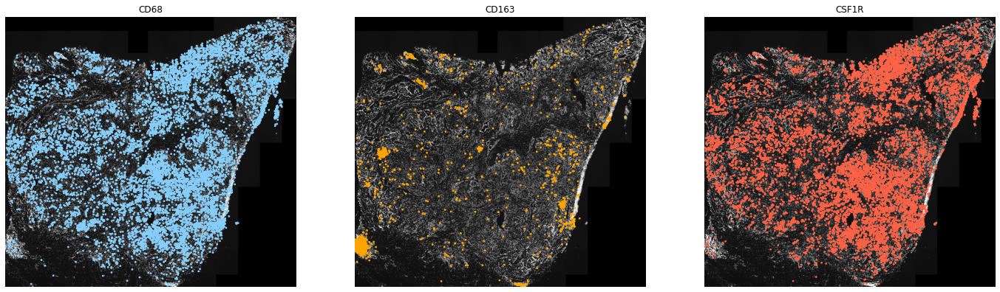

In [68]:

fig, axs = plt.subplots(1,3,figsize=(8*3,8))


genes = ['CD68','CD163', 'CSF1R']
colors = ['lightskyblue', 'lightskyblue', 'lightskyblue']

axs[0].imshow(img_dapi_imm, cmap='Greys_r', vmin=0, vmax=1)
pos_x = []
pos_y = []
p_color = []
for i, allele in enumerate(genes):
    pos_x.append(df_imm.X[df_imm.Name == allele]/10)
    pos_y.append(df_imm.Y[df_imm.Name == allele]/10)
    p_color.append([colors[i]]*(df_imm.Name == allele).sum())
pos_x = np.concatenate(pos_x)
pos_y = np.concatenate(pos_y)
p_color = np.concatenate(p_color)
p_order = np.random.permutation(p_color.shape[0])
axs[0].scatter(pos_x[p_order], pos_y[p_order], color=p_color[p_order], s=3, rasterized=True)  
axs[0].set_aspect('equal')
axs[0].axis('off')
axs[0].set_title('CD68')

genes = ['MS4A1']
colors = ['orange']
axs[1].imshow(img_dapi_imm, cmap='Greys_r', vmin=0, vmax=1)
pos_x = []
pos_y = []
p_color = []
for i, allele in enumerate(genes):
    pos_x.append(df_imm.X[df_imm.Name == allele]/10)
    pos_y.append(df_imm.Y[df_imm.Name == allele]/10)
    p_color.append([colors[i]]*(df_imm.Name == allele).sum())
pos_x = np.concatenate(pos_x)
pos_y = np.concatenate(pos_y)
p_color = np.concatenate(p_color)
p_order = np.random.permutation(p_color.shape[0])
axs[1].scatter(pos_x[p_order], pos_y[p_order], color=p_color[p_order], s=3, rasterized=True)  
axs[1].set_aspect('equal')
axs[1].axis('off')
axs[1].set_title('CD163')


genes = ['FCGR3A','HAVCR2', 'IDO1']
colors = ['tomato', 'tomato', 'tomato']
axs[2].imshow(img_dapi_imm, cmap='Greys_r', vmin=0, vmax=1)
pos_x = []
pos_y = []
p_color = []
for i, allele in enumerate(genes):
    pos_x.append(df_imm.X[df_imm.Name == allele]/10)
    pos_y.append(df_imm.Y[df_imm.Name == allele]/10)
    p_color.append([colors[i]]*(df_imm.Name == allele).sum())
pos_x = np.concatenate(pos_x)
pos_y = np.concatenate(pos_y)
p_color = np.concatenate(p_color)
p_order = np.random.permutation(p_color.shape[0])
axs[2].scatter(pos_x[p_order], pos_y[p_order], color=p_color[p_order], s=3, rasterized=True)  
axs[2].set_aspect('equal')
axs[2].axis('off')
axs[2].set_title('CSF1R')

